**Let start with some installation**

In [3]:
!pip install turicreate
!pip install gensim==3.8.3
!pip install pyLDAvis
!python -m spacy download en_core_web_lg # Important! you need to restart runtime after install

     |████████████████████████████████| 91.9MB 33kB/s 
     |████████████████████████████████| 327kB 58.0MB/s 
     |████████████████████████████████| 86.3MB 57kB/s 
     |████████████████████████████████| 3.4MB 48.2MB/s 
     |████████████████████████████████| 450kB 58.7MB/s 
     |████████████████████████████████| 3.8MB 56.9MB/s 
  Created wheel for resampy: filename=resampy-0.2.1-cp36-none-any.whl size=320850 sha256=1f0b1288f74269312a7a7b041c52be1f1d51e440773d98e9338061627f2392fd
  Stored in directory: /root/.cache/pip/wheels/ff/4f/ed/2e6c676c23efe5394bb40ade50662e90eb46e29b48324c5f9b
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=ffce48f64552255bd3b69059165098bb8902ec327777b162cc01652075dc291f
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built resampy gast
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Fo

# Question 1 - Part A



This dataset downloded from the UK: https://coronavirus.data.gov.uk/#category=ltlas&map=rate

There are serveral level of areas, I selected the most detailed one, which is called region

In [1]:
import turicreate as tc

# This dataset downloded from the UK: https://coronavirus.data.gov.uk/#category=ltlas&map=rate
latest_cases_csv = 'https://coronavirus.data.gov.uk/downloads/csv/coronavirus-cases_latest.csv'
# There are serveral level of areas, I selected the most detailed one, which is called region
area_type = 'Region'
latest_cases_sf = tc.SFrame.read_csv(latest_cases_csv)
latest_cases_sf

Downloading https://coronavirus.data.gov.uk/downloads/csv/coronavirus-cases_latest.csv to /var/tmp/turicreate-root/812/ad48a999-fa40-4b52-9982-3ae3ef3f36eb.csv

Finished parsing file https://coronavirus.data.gov.uk/downloads/csv/coronavirus-cases_latest.csv

Parsing completed. Parsed 100 lines in 0.164431 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,str,str,str,float,int,int,int,int,int,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file https://coronavirus.data.gov.uk/downloads/csv/coronavirus-cases_latest.csv

Parsing completed. Parsed 40098 lines in 0.090535 secs.

Area name,Area code,Area type,Specimen date,Daily lab-confirmed cases,Previously reported dailycases ...
England,E92000001,Nation,2020-06-29,14.0,0
South West,E12000009,Region,2020-06-29,1.0,None
South East,E12000008,Region,2020-06-29,2.0,None
London,E12000007,Region,2020-06-29,1.0,None
East of England,E12000006,Region,2020-06-29,0.0,None
West Midlands,E12000005,Region,2020-06-29,2.0,None
East Midlands,E12000004,Region,2020-06-29,3.0,None
Yorkshire and The Humber,E12000003,Region,2020-06-29,4.0,None
North West,E12000002,Region,2020-06-29,0.0,None
North East,E12000001,Region,2020-06-29,1.0,None


Select only the relevant area

In [2]:
latest_cases_sf = latest_cases_sf[latest_cases_sf['Area type'] == area_type]
latest_cases_sf

Area name,Area code,Area type,Specimen date,Daily lab-confirmed cases,Previously reported dailycases ...
South West,E12000009,Region,2020-06-29,1.0,None
South East,E12000008,Region,2020-06-29,2.0,None
London,E12000007,Region,2020-06-29,1.0,None
East of England,E12000006,Region,2020-06-29,0.0,None
West Midlands,E12000005,Region,2020-06-29,2.0,None
East Midlands,E12000004,Region,2020-06-29,3.0,None
Yorkshire and The Humber,E12000003,Region,2020-06-29,4.0,None
North West,E12000002,Region,2020-06-29,0.0,None
North East,E12000001,Region,2020-06-29,1.0,None
South West,E12000009,Region,2020-06-28,4.0,None


In [3]:
latest_cases_sf.show()

Materializing SFrame

Filter non releveant columns

In [4]:
rel_columns = ['Area name', 'Area code', 'Specimen date', 
               'Daily lab-confirmed cases', 'Cumulative lab-confirmed cases',
               'Cumulative lab-confirmed cases rate']
latest_cases_ltla_sf = latest_cases_sf[rel_columns]
latest_cases_ltla_sf

Area name,Area code,Specimen date,Daily lab-confirmed cases,Cumulative lab-confirmedcases ...,Cumulative lab-confirmedcases rate ...
South West,E12000009,2020-06-29,1.0,7959,142.1
South East,E12000008,2020-06-29,2.0,22850,250.2
London,E12000007,2020-06-29,1.0,27670,310.6
East of England,E12000006,2020-06-29,0.0,15288,246.5
West Midlands,E12000005,2020-06-29,2.0,17077,289.4
East Midlands,E12000004,2020-06-29,3.0,9944,207.0
Yorkshire and The Humber,E12000003,2020-06-29,4.0,15346,280.1
North West,E12000002,2020-06-29,0.0,27303,374.4
North East,E12000001,2020-06-29,1.0,10558,397.2
South West,E12000009,2020-06-28,4.0,7958,142.1


**Find the longitude and latitude of these regions**

In [5]:
locations_list = list(set(latest_cases_ltla_sf['Area name']))
print(f'Number of locations: {len(locations_list)}')
for i in range(len(locations_list)):
  locations_list[i] = locations_list[i] + ', England'
locations_list[:10]

Number of locations: 9


['East of England, England',
 'East Midlands, England',
 'West Midlands, England',
 'London, England',
 'Yorkshire and The Humber, England',
 'North West, England',
 'South East, England',
 'South West, England',
 'North East, England']

Find the longitude and latitude of these regions

In [6]:
import requests
import urllib.parse

locs_dict = {'loc': [], 'lat': [], 'lon': []}

for loc in locations_list:
  try:
    url = 'https://nominatim.openstreetmap.org/search/' + urllib.parse.quote(loc) +'?format=json'

    response = requests.get(url).json()
    lat = response[0]["lat"]
    lon = response[0]["lon"]
    loc_name = loc.split(',')[0]
    print(f'Location: {loc_name}, lat: {lat}, lon: {lon}')
    locs_dict['loc'].append(loc_name)
    locs_dict['lat'].append(lat)
    locs_dict['lon'].append(lon)
  except:
    print(f'Can not find location: {loc}')

Location: East of England, lat: 52.2199774, lon: 0.4875777469166293
Location: East Midlands, lat: 52.796575149999995, lon: -0.671822256833873
Location: West Midlands, lat: 52.5050033, lon: -1.964396123331272
Location: London, lat: 51.5073219, lon: -0.1276474
Location: Yorkshire and The Humber, lat: 53.9318994, lon: -1.1664716608886017
Location: North West, lat: 52.2370231, lon: -0.4686149
Location: South East, lat: 51.451019099999996, lon: -0.9934914404975159
Location: South West, lat: 51.4742479, lon: -0.12433969996478875
Location: North East, lat: 52.4160035, lon: -1.9701231


Join data with the longitude and latitude of these regions

In [7]:
import pandas as pd
df_locations = pd.DataFrame.from_dict(locs_dict)
latest_cases_ltla_df = latest_cases_ltla_sf.to_dataframe()
latest_cases_ltla_df = latest_cases_ltla_df.set_index('Area name')
df_locations = df_locations.set_index('loc')
latest_cases_ltla_df_joined = latest_cases_ltla_df.join(df_locations)
# latest_cases_ltla_df_joined = latest_cases_ltla_df_joined.reset_index()
latest_cases_ltla_df_joined

,Area code,Specimen date,Daily lab-confirmed cases,Cumulative lab-confirmed cases,Cumulative lab-confirmed cases rate,lat,lon
East Midlands,E12000004,2020-06-29,3.0,9944,207.0,52.796575149999995,-0.671822256833873
East Midlands,E12000004,2020-06-28,5.0,9941,206.9,52.796575149999995,-0.671822256833873
East Midlands,E12000004,2020-06-27,15.0,9936,206.8,52.796575149999995,-0.671822256833873
East Midlands,E12000004,2020-06-26,18.0,9921,206.5,52.796575149999995,-0.671822256833873
East Midlands,E12000004,2020-06-25,24.0,9903,206.1,52.796575149999995,-0.671822256833873
...,...,...,...,...,...,...,...
Yorkshire and The Humber,E12000003,2020-02-29,1.0,7,0.1,53.9318994,-1.1664716608886017
Yorkshire and The Humber,E12000003,2020-02-28,2.0,6,0.1,53.9318994,-1.1664716608886017
Yorkshire and The Humber,E12000003,2020-02-20,2.0,4,0.1,53.9318994,-1.1664716608886017
Yorkshire and The Humber,E12000003,2020-02-03,1.0,2,0.0,53.9318994,-1.1664716608886017


In [8]:

# Manipulating the original dataframe
column_of_interst = 'Cumulative lab-confirmed cases'
date_column = 'Specimen date'
df_countries_date = latest_cases_ltla_df_joined.copy()
df_countries_date = df_countries_date[df_countries_date[column_of_interst]>0]
df_countries_date = df_countries_date.sort_values(date_column, ascending=True)
# df_countries_date['Specimen date'] =pd.to_datetime(df_countries_date['Specimen date'])
# df_countries_date['lat,lon'] = df_countries_date['lat'].astype(str) + ',' + df_countries_date['lon'].astype(str)
df_countries_date['lat'] = df_countries_date['lat'].astype('float')
df_countries_date['lon'] = df_countries_date['lon'].astype('float')
df_countries_date = df_countries_date.reset_index()
df_countries_date = df_countries_date.rename(columns={'index': 'Area name'})
df_countries_date

,Area name,Area code,Specimen date,Daily lab-confirmed cases,Cumulative lab-confirmed cases,Cumulative lab-confirmed cases rate,lat,lon
0,Yorkshire and The Humber,E12000003,2020-01-30,1.0,1,0.0,53.931899,-1.166472
1,South East,E12000008,2020-02-03,1.0,1,0.0,51.451019,-0.993491
2,East of England,E12000006,2020-02-03,1.0,1,0.0,52.219977,0.487578
3,South West,E12000009,2020-02-03,2.0,2,0.0,51.474248,-0.124340
4,Yorkshire and The Humber,E12000003,2020-02-03,1.0,2,0.0,53.931899,-1.166472
...,...,...,...,...,...,...,...,...
1116,West Midlands,E12000005,2020-06-29,2.0,17077,289.4,52.505003,-1.964396
1117,North East,E12000001,2020-06-29,1.0,10558,397.2,52.416004,-1.970123
1118,South West,E12000009,2020-06-29,1.0,7959,142.1,51.474248,-0.124340
1119,East of England,E12000006,2020-06-29,0.0,15288,246.5,52.219977,0.487578


**Cumulative lab-confirmed cases rate versus Cumulative lab-confirmed cases (The count for each area is divided by the total population and multiplied by 100,000).**

**Color and size represent the Daily lab-confirmed cases.**

In [9]:
import plotly.express as px
df = px.data.gapminder()
x='Cumulative lab-confirmed cases rate'
y=column_of_interst
color = "Daily lab-confirmed cases"
size = "Daily lab-confirmed cases"
px.scatter(df_countries_date, x=x, y=y, animation_frame=date_column, animation_group="Area name",
           size=size, color=color, hover_name="Area name",
           log_x=False, size_max=55, range_x=[df_countries_date[x].min(), 
                                              df_countries_date[x].max()], 
           range_y=[df_countries_date[y].min(), df_countries_date[y].max()],
           range_color=[df_countries_date[color].min(), df_countries_date[color].max()],
           title=f'{x} versus {y} (The count for each area is divided by the total population and multiplied by 100,000).')

**Cumulative lab-confirmed cases over time in U.K.**

**Color and size represent the Cumulative lab-confirmed**

In [10]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
eps = 3
max_lat = df_countries_date['lat'].max()
min_lat = df_countries_date['lat'].min()
min_lon = df_countries_date['lon'].min()
max_lon = df_countries_date['lon'].max()

fig = px.scatter_geo(df_countries_date, 
                     lat='lat', 
                     lon='lon', 
                     scope='europe',
                     hover_data = ['Area name'],
                     size_max = 50,
                     color=column_of_interst, 
                     size=column_of_interst,
                    #  color_continuous_scale='Reds',
                     animation_frame=date_column)

fig.update_layout(
        title_text = f'{column_of_interst} over time in U.K.',
        showlegend = True,
        geo = go.layout.Geo(
            resolution = 50,
            scope = 'world',
            showframe = False,
            showcoastlines = True,
            landcolor = "rgb(229, 229, 229)",
            countrycolor = "white" ,
            coastlinecolor = "white",
            projection_type = 'hammer',
            lonaxis_range= [min_lon - eps, max_lon + eps],
            lataxis_range= [min_lat - eps , max_lat + eps ]
        )
    )
fig.show()

# Question 1 - Part B



**First of all, let's install the pytrends to connect with the Google trends API**

In [11]:
!pip install pytrends

**Second of all, let's see the coronoa virus in England (all the regions together) over time.**

In [12]:
area_type = 'Nation'
latest_cases_nation_df = tc.SFrame.read_csv(latest_cases_csv).to_dataframe()
latest_cases_nation_df = latest_cases_nation_df[latest_cases_nation_df['Area type'] == area_type] 
latest_cases_nation_df['YearMonth'] = pd.to_datetime(latest_cases_nation_df['Specimen date']).apply(lambda x: '{year}-{month}'.format(year=x.year, month=x.month))
latest_cases_nation_df

Finished parsing file https://coronavirus.data.gov.uk/downloads/csv/coronavirus-cases_latest.csv

Parsing completed. Parsed 100 lines in 0.170926 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,str,str,str,float,int,int,int,int,int,float]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Finished parsing file https://coronavirus.data.gov.uk/downloads/csv/coronavirus-cases_latest.csv

Parsing completed. Parsed 40098 lines in 0.084473 secs.

,Area name,Area code,Area type,Specimen date,Daily lab-confirmed cases,Previously reported daily cases,Change in daily cases,Cumulative lab-confirmed cases,Previously reported cumulative cases,Change in cumulative cases,Cumulative lab-confirmed cases rate,YearMonth
0,England,E92000001,Nation,2020-06-29,14.0,0.0,14.0,160587,160391.0,196.0,286.9,2020-6
476,England,E92000001,Nation,2020-06-28,38.0,9.0,29.0,160573,160391.0,182.0,286.9,2020-6
550,England,E92000001,Nation,2020-06-27,91.0,57.0,34.0,160535,160382.0,153.0,286.8,2020-6
666,England,E92000001,Nation,2020-06-26,146.0,116.0,30.0,160444,160325.0,119.0,286.6,2020-6
818,England,E92000001,Nation,2020-06-25,159.0,150.0,9.0,160298,160209.0,89.0,286.4,2020-6
...,...,...,...,...,...,...,...,...,...,...,...,...
40067,England,E92000001,Nation,2020-02-09,1.0,1.0,0.0,14,14.0,0.0,0.0,2020-2
40071,England,E92000001,Nation,2020-02-08,4.0,4.0,0.0,13,13.0,0.0,0.0,2020-2
40077,England,E92000001,Nation,2020-02-05,1.0,1.0,0.0,9,9.0,0.0,0.0,2020-2
40081,England,E92000001,Nation,2020-02-03,6.0,6.0,0.0,8,8.0,0.0,0.0,2020-2


Daily lab-confirmed cases over time in England

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



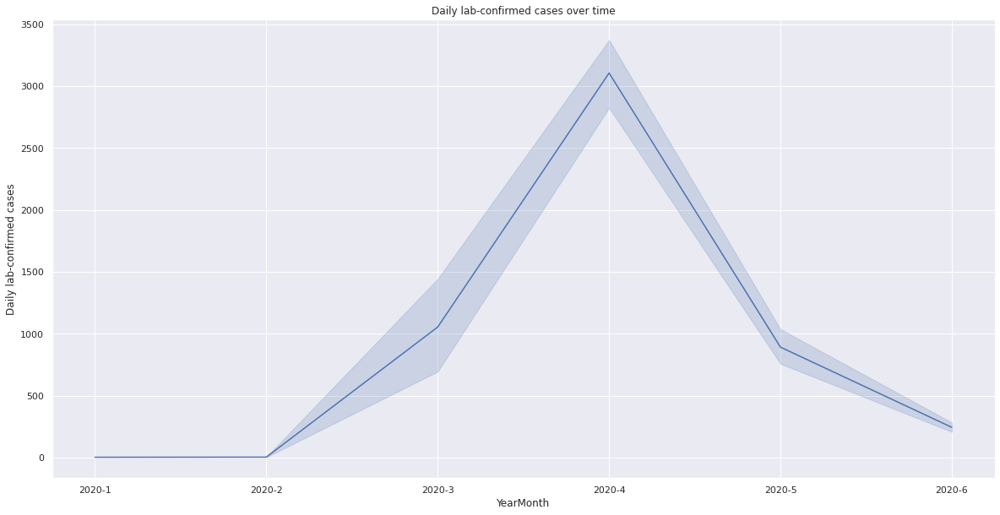

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
plt.figure(figsize=(20, 10))
sns.set(color_codes=True)
dx = sns.lineplot(x="YearMonth", y="Daily lab-confirmed cases", 
                  data=latest_cases_nation_df).set_title('Daily lab-confirmed cases over time')


**The influance of COVID-19 on two topics.**


**Topic #1 - Culture and Sport**

Here, I will show the influance of COVID-19 on the instest of the people in England on the Football / Soccer Clubs.



In [14]:
import pytrends
from pytrends.request import TrendReq
import pandas as pd
import time
import datetime
from datetime import datetime, date, time


pytrend = TrendReq()
kw_list=['liverpool', 'manchester city', 'manchester united', 'arsenal', 'tottenham']

pytrend.build_payload(kw_list=kw_list, timeframe='today 5-y', geo = 'GB')

#to get interest over time score, you'll need pytrend.interest_over_time() function.
#For more functions, check this: https://github.com/GeneralMills/pytrends
interest_over_time_df = pytrend.interest_over_time() 
interest_over_time_df

,liverpool,manchester city,manchester united,arsenal,tottenham,isPartial
date,,,,,,
2015-07-05,42,2,9,18,6,False
2015-07-12,45,2,12,22,6,False
2015-07-19,44,3,12,21,6,False
2015-07-26,42,2,12,23,7,False
2015-08-02,44,2,14,30,11,False
...,...,...,...,...,...,...
2020-05-24,25,1,2,7,3,False
2020-05-31,27,1,3,7,3,False
2020-06-07,28,1,3,8,4,False


England Football / Soccer Clubs Interest Over Time

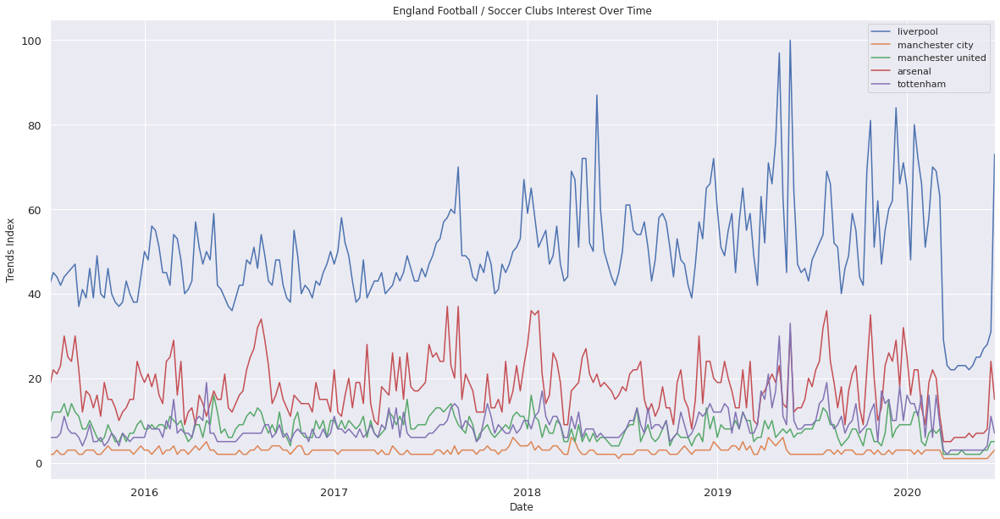

In [15]:
sns.set(color_codes=True)
dx = interest_over_time_df.plot.line(figsize = (20,10), title = "England Football / Soccer Clubs Interest Over Time")
dx.set_xlabel('Date')
dx.set_ylabel('Trends Index')
dx.tick_params(axis='both', which='major', labelsize=13)

In [16]:
pytrend.build_payload(kw_list=kw_list, timeframe='today 12-m', geo = 'GB')

#to get interest over time score, you'll need pytrend.interest_over_time() function.
#For more functions, check this: https://github.com/GeneralMills/pytrends
interest_over_time_df = pytrend.interest_over_time() 
interest_over_time_df

,liverpool,manchester city,manchester united,arsenal,tottenham,isPartial
date,,,,,,
2019-07-07,59,2,10,22,11,False
2019-07-14,61,2,12,27,12,False
2019-07-21,62,2,12,30,17,False
2019-07-28,65,2,15,38,18,False
2019-08-04,84,4,15,44,23,False
2019-08-11,79,3,11,29,12,False
2019-08-18,63,2,11,23,9,False
2019-08-25,59,3,8,16,12,False
2019-09-01,49,2,5,21,13,False


England Football / Soccer Clubs Interest Over Time (between Jul 2019 and Jul 2020)

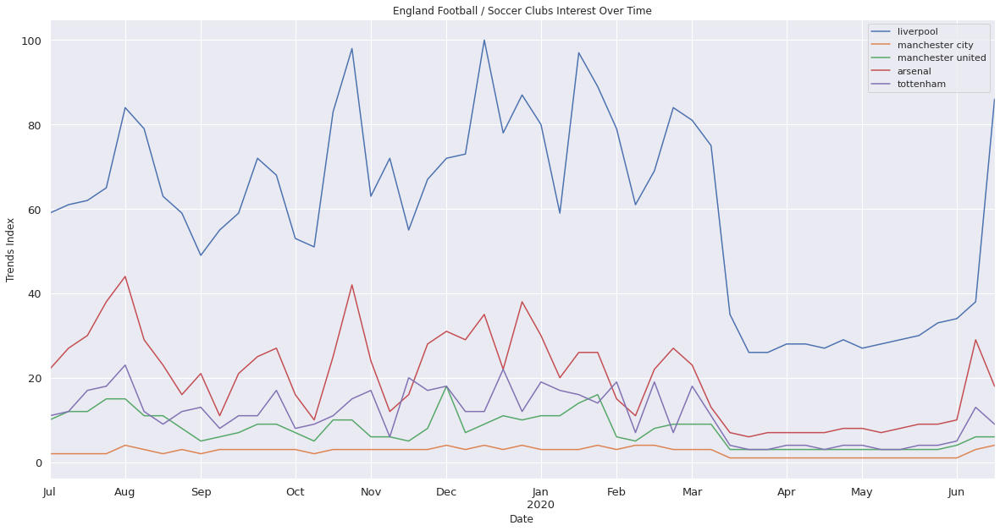

In [17]:
sns.set(color_codes=True)
dx = interest_over_time_df.plot.line(figsize = (20,10), title = "England Football / Soccer Clubs Interest Over Time")
dx.set_xlabel('Date')
dx.set_ylabel('Trends Index')
dx.tick_params(axis='both', which='major', labelsize=13)

**The influance of COVID-19 on two topics.**


**Topic #2 - Transportation**

Here, I will show the influance of COVID-19 on the transportation in England, in particular I focus the transportation in London.


The data was donwloded from *LONDON DATASTORE* website:
https://data.london.gov.uk/dataset/public-transport-journeys-type-transport

Number of journeys on the public transport network by TFL reporting period, by type of transport. Data is broken down by bus, underground, DLR, tram, Overground and cable car.

![alt text](https://github.com/nevoit/Analyzing-Big-Data-Course/blob/master/exam_london_trans.png?raw=true)

Docklands Light Railway journeys are based on automatic passenger counts at stations.
Overground and Tram journeys are based on automatic on-carriage passenger counts.
Reliable Overground journey numbers have only been available since October 2010.

The Emirates Air Line cable car service began 28 June 2012.

 Weekly passenger statistics are available from the TFL website.


In [18]:
def add_to_dict(dict_to_add, tran_date, tran_type, tran_value):
    dict_to_add['date'].append(tran_date)
    dict_to_add['type'].append(tran_type)
    dict_to_add['value'].append(tran_value)

trans_data = 'https://data.london.gov.uk/download/public-transport-journeys-type-transport/06a805f6-77c6-481a-8b08-ddef56afffdd/tfl-journeys-type.csv'
trans_df = pd.read_csv(trans_data, encoding='latin-1')
trans_df = trans_df.sort_values(by=['Period ending'], ascending=False)
trans_df['YearMonth'] = pd.to_datetime(trans_df['Period ending']).apply(lambda x: '{year}-{month}'.format(year=x.year, month=x.month))
trans_df

dict_to_add = {'date': [], 'type': [], 'value': []}
for index, row in trans_df.iterrows():
  list_of_key_to_add = ['Bus journeys (m)','Underground journeys (m)', 'Underground journeys (m)',	'DLR Journeys (m)',	'Tram Journeys (m)',	'Overground Journeys (m)',	'Emirates Airline Journeys (m)',	'TfL Rail Journeys (m)']
  for tran_key in list_of_key_to_add:
    add_to_dict(dict_to_add, tran_date=row['YearMonth'], tran_type=tran_key, tran_value=row[tran_key])

trans_df_new = pd.DataFrame.from_dict(dict_to_add)
trans_df_new

,date,type,value
0,2020-3,Bus journeys (m),122.50
1,2020-3,Underground journeys (m),60.90
2,2020-3,Underground journeys (m),60.90
3,2020-3,DLR Journeys (m),6.10
4,2020-3,Tram Journeys (m),1.60
...,...,...,...
1043,2014-2,DLR Journeys (m),7.80
1044,2014-2,Tram Journeys (m),2.40
1045,2014-2,Overground Journeys (m),10.30
1046,2014-2,Emirates Airline Journeys (m),0.07


Logarithmic Number of journeys on the public transport network (millions) over time

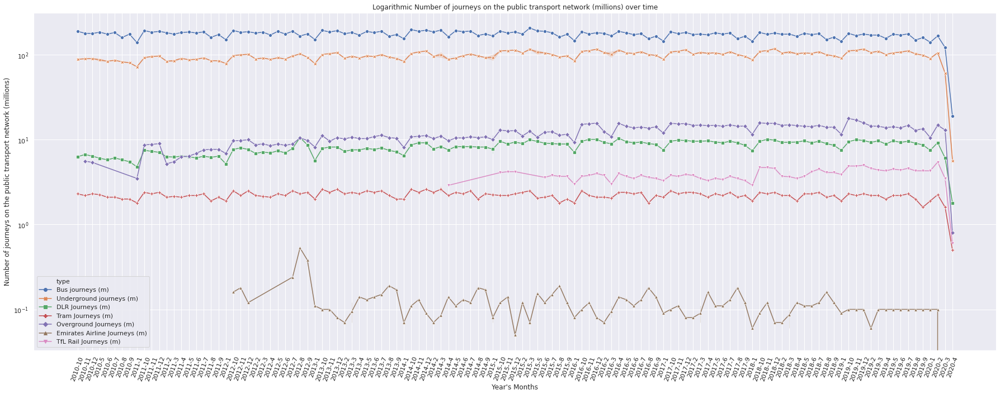

In [19]:
%matplotlib inline
plt.figure(figsize=(25, 10))
sns.set(color_codes=True)


ax = sns.lineplot(x="date", y="value", hue="type", style="type",
                  markers=True, dashes=False, data=trans_df_new)
ax.set(yscale="log", title='Logarithmic Number of journeys on the public transport network (millions) over time', ylabel='Number of journeys on the public transport network (millions)', xlabel='Year\'s Months')

plt.xticks(rotation=70)
plt.tight_layout()

Another option to evaluate the change in the transportation is tracking the activity and retail metrics obtained from Google, Apple, Purple, Citymapper, Transport for London and OpenTable.

I found this data here:
https://data.london.gov.uk/dataset/coronavirus-covid-19-mobility-report


The Citymapper Mobility Index shows a huge reduction in journeys made by Londoners, through all methods, estimated from app usage and journeys tracked. At its minimum, journeys dropped to 7% of normal.

Google's Mobility Report transit station data and Apple's Mobility Index public transport metrics show similar drops, though not as large, with Google's transit station traffic currently at 40% of normal, and Apple's at 41%.

TfL breaks down changes in traffic on the tube and bus, showing the largest relative decrease in tube journeys. Currently tube usage is at 10% of normal. Data on bus passengers has not been collected since mid-April when fares were suspended.

In [20]:
mob_data = 'https://data.london.gov.uk/download/coronavirus-covid-19-mobility-report/20bb3a40-20ae-4020-984a-def0c7f4afd1/activity_transport.csv'
mob_df = pd.read_csv(mob_data, encoding='latin-1')
mob_df = mob_df.sort_values(by=['date'], ascending=False)
mob_df['activity'] = mob_df['activity'].astype(str)
mob_df['source'] = mob_df['activity'].astype(str)
mob_df['value'] = mob_df['value'].astype(float)
mob_df['date'] = pd.to_datetime(mob_df['date'])

mob_df = mob_df.sort_values(by=['date'], ascending=False)
mob_df

,date,activity,value,source
244,2020-06-30,Journeys,25.00,Journeys
123,2020-06-29,transit,43.61,transit
243,2020-06-29,Journeys,26.00,Journeys
242,2020-06-28,Journeys,28.00,Journeys
122,2020-06-28,transit,41.37,transit
...,...,...,...,...
2,2020-02-29,transit,129.48,transit
246,2020-02-28,Transit stations,98.00,Transit stations
1,2020-02-28,transit,122.41,transit
245,2020-02-27,Transit stations,99.00,Transit stations


Mobility indices For London over time

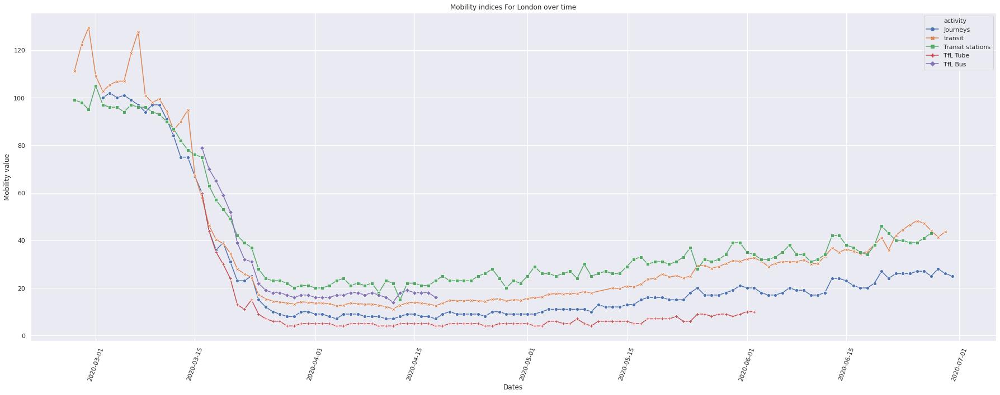

In [21]:
%matplotlib inline
plt.figure(figsize=(25, 10))
sns.set(color_codes=True)


ax = sns.lineplot(x="date", y="value", hue="activity", style="activity", markers=True, dashes=False, data=mob_df)
ax.set(title='Mobility indices For London over time', ylabel='Mobility value', xlabel='Dates')

plt.xticks(rotation=70)
plt.tight_layout()

# Question 2

**Connect to Kaggle**

In [22]:
# see more details in the course first lecture
!mkdir /root/.kaggle/
import json
import os

# Installing the Kaggle package
!pip install kaggle 

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"", "key":""}  # TODO: REMOVE THIS LINE!!!

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

**Download the dataset from kaggle**

In [23]:
DATASET_NAME = 'ufo'
KAGGLE_REPO = 'NUFORC/ufo-sightings'

In [24]:
# searching for the dataset
!rm -r ./datasets/$DATASET_NAME/
!mkdir -p ./datasets/$DATASET_NAME/data
!mkdir -p ./datasets/$DATASET_NAME/zip
!ls datasets/$DATASET_NAME/data

!kaggle datasets list -s $DATASET_NAME
# download the dataset from Kaggle and unzip it
!kaggle datasets download $KAGGLE_REPO -p ./datasets/$DATASET_NAME/zip
!unzip ./datasets/$DATASET_NAME/zip/*.zip -d ./datasets/$DATASET_NAME/data
!ls ./datasets/$DATASET_NAME/zip/
!ls ./datasets/$DATASET_NAME/data/

rm: cannot remove './datasets/ufo/': No such file or directory
ref                                               title                                  size  lastUpdated          downloadCount  
------------------------------------------------  ------------------------------------  -----  -------------------  -------------  
NUFORC/ufo-sightings                              UFO Sightings                          10MB  2019-11-13 19:45:57          17700  
camnugent/ufo-sightings-around-the-world          UFO Sightings around the world          5MB  2017-08-15 15:46:17           1933  
emorelli/consolidated-ufo-weather-data            Consolidated UFO and Weather Data       4MB  2018-05-16 20:06:50            605  
karenfisher/updated-nuforc-ufo-sightings-dataset  Updated NUFORC UFO Sightings Dataset    3MB  2020-05-23 03:45:48              2  
ajayrana/ufo-reports                              ufo_reports                           195KB  2017-11-04 12:43:02            265  
aman9d/uforep

**Let's start with the file reading. I read the `scrubbed.csv`, which is similar to the `complete.csv` but with more filters.**

The state I selected was **Michigan (MN)** with 1081 UFO occurrences.


In [25]:
import pandas as pd

selected_state = 'mn'
selected_state_full = 'Michigan'

# This file is similar to the complete.csv file but with more filters
FILE_TO_READ = f'./datasets/{DATASET_NAME}/data/scrubbed.csv'
ufo_df = pd.read_csv(FILE_TO_READ, low_memory=False)
ufo_df = ufo_df[ufo_df['state'] == selected_state]  # filter non relevant states

# This code handle the data time column and creates an year column
ufo_df[['date','time']] = ufo_df['datetime'].str.split(expand=True)
ufo_df['datetime'] = (pd.to_datetime(ufo_df.pop('date'), format='%m/%d/%Y') + 
                      pd.to_timedelta(ufo_df.pop('time') + ':00'))
ufo_df['datetime'] = pd.to_datetime(ufo_df['datetime'])
ufo_df['year'] = pd.DatetimeIndex(ufo_df['datetime']).year

# Somehow there is a space after the column name longitude :|
ufo_df = ufo_df.rename(columns={'longitude ': 'longitude'})
ufo_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year
71,1997-10-10 21:00:00,austin,mn,us,other,3600,1-hour,i was traveling northbound on state highway 10...,1/28/1999,43.6666667,-92.974444,1997
139,2004-10-10 21:00:00,faribault,mn,us,flash,900,1/2 hour,Metor or craft descending then sudden flash of...,10/27/2004,44.2950000,-93.268611,2004
153,2005-10-10 23:07:00,brainerd,mn,us,disk,300,5 min.,A big lighted up silver saucer.,10/30/2006,46.3580556,-94.200556,2005
179,2007-10-10 22:00:00,duluth,mn,us,light,600,10 minutes,Bright pulsating light over lake superior.,1/21/2008,46.7833333,-92.106389,2007
186,2008-10-10 02:00:00,north branch,mn,us,light,300,5 min,Lights at night&#44 shining into car and garag...,10/31/2008,45.5113889,-92.980000,2008
...,...,...,...,...,...,...,...,...,...,...,...,...
79853,2013-09-07 13:00:00,cass lake,mn,us,oval,10,10 seconds,High altitude and speed oval object. Disappear...,9/9/2013,47.3794444,-94.603889,2013
80001,2009-09-08 20:30:00,ely,mn,us,other,300,5 min,star like crafts moving at high rate of speed...,12/12/2009,47.9033333,-91.866944,2009
80004,2009-09-08 21:00:00,isanti,mn,us,formation,300,5 minutes,2 Strange lights in a line formation. ((NUFOR...,12/12/2009,45.4902778,-93.247500,2009
80199,2005-09-09 19:00:00,nodine,mn,us,light,15,15 seconds,orange ball of light in the horizon moving rap...,10/11/2005,43.9050000,-91.436111,2005


## Question 2 Part 1:

**Now, let's group all the occurrences of a city in a specific year and count the number of occurences.**

In [26]:
# for this question the onlt following columns are intersting:
columns_to_group_by = ['year', 'city', 'latitude', 'longitude']
more_columns = ['datetime']  # just want to use this column for counting

# first, filter columns, then group all the occurrences of a city in a specific year and count the number of occurences
ufo_df_gb = ufo_df[columns_to_group_by+more_columns].groupby(columns_to_group_by).count()
ufo_df_gb = ufo_df_gb.reset_index()

# convert latitude, longitude columns to float
ufo_df_gb['latitude'] = ufo_df_gb['latitude'].astype(float)
ufo_df_gb['longitude'] = ufo_df_gb['longitude'].astype(float)

# sort the new data frame by year
ufo_df_gb = ufo_df_gb.sort_values(by=['year'])
ufo_df_gb

,year,city,latitude,longitude,datetime
0,1947,minneapolis,44.980000,-93.263611,1
1,1947,winona (aprox.20 mi.north west of),44.050000,-91.639167,1
2,1949,excelsior,44.903333,-93.566111,1
3,1952,sebeka,46.630000,-95.088611,1
4,1955,bagley,47.521667,-95.398056,1
...,...,...,...,...,...
815,2014,bemidji,47.473611,-94.880000,1
813,2014,albert lea,43.648056,-93.368056,1
833,2014,st. cloud,45.560833,-94.162222,1
822,2014,lakeville,44.649722,-93.242500,1


Since the data doesn't contain a UFO occurrence for each city and year over time, the data frame we want to create is a bit complex.
To create a cumulative data frame, we have to fill up missing years, which is not a straightforward task.

For example, let's assume we have the following records for the city: Minneapolis:


*   year: `1947`, city: `Minneapolis`, UFO occurrences: `5`
*   year: `1968`, city: `Minneapolis`, UFO occurrences: `1`
*   year: `2013`, city: `Minneapolis`, UFO occurrences: `14`

We need to fill the records between 1947 and 1968 and the records between 1968 and 2017. 

For example, we need to create a new row for Minneapolis:
*   year: `1967`, city: `Minneapolis`, UFO occurrences: `6`

or:
*   year: `2014`, city: `Minneapolis`, UFO occurrences: `20`


In [ ]:
column_of_interst = 'Cumulative UFO Occurrences'

def get_cum_for_city(ufo_df_gb, city, year, current_value) -> (int, int):
  # This function gets a data frame, city, current year and current value 
  # and returns the cumulative amount until this current year.
  # This function also returns the previous year in order to fill missing years.
  sum_value = 0
  ufo_df_gb_before = ufo_df_gb[(ufo_df_gb['city']==city) & (ufo_df_gb['year'] < year)]
  sum_value = ufo_df_gb_before['datetime'].sum()
  prev_year = ufo_df_gb_before['year'].max()
  cum_value = current_value + sum_value
  return cum_value, prev_year

def add_to_cum_year_city(cum_year_city, year, city, lat, lon, cum_val):
  cum_year_city['year'].append(year)
  cum_year_city['city'].append(city)
  cum_year_city['latitude'].append(lat)
  cum_year_city['longitude'].append(lon)
  cum_year_city[column_of_interst].append(cum_val)

# Let's start with some configurations.
# we use this dict to convert to data frame
cum_year_city = {'year': [],
                 'city': [],
                 'latitude': [],
                 'longitude': [],
                 column_of_interst: []}
prev_val = {}  # for each city, we save the previous cumulative value
last_year = {}  # for each city, we save the previous added year
detailed_city = {}  # for each city, we save the coordinates

for index, row in ufo_df_gb.iterrows(): # This loop iterates over the data frame
  city_name = row['city']
  current_year = row['year']
  current_cum, prev_year = get_cum_for_city(ufo_df_gb, city_name, row['year'], row['datetime'])
  # fill years between years, for example if the previous year is 1945 and 
  # the current year is 1948, we need to add 1946, 1947
  if current_year - prev_year > 1:  # if there is a gap
    for i in range(1, current_year - prev_year):
      # we need to use the pervious cumulative value
      add_to_cum_year_city(cum_year_city, year=prev_year + i,
                           city=city_name, lat=row['latitude'],
                           lon=row['longitude'], cum_val=prev_val[city_name])
  # Update dictionary here
  prev_val[city_name] = current_cum
  last_year[city_name] = current_year
  if city_name not in detailed_city:
    detailed_city[city_name] = {'latitude': row['latitude'],
                                'longitude': row['longitude']}

  # Add current year             
  add_to_cum_year_city(cum_year_city, year=current_year,
                      city=city_name, lat=row['latitude'],
                      lon=row['longitude'], cum_val=current_cum)



max_year_key = max(last_year, key=last_year.get)
max_year = last_year[max_year_key]
print(f'Maximum year in data is: {max_year}')

# For completeness, we need to find the maximum year in the data and fill up
# years until this maximum year for each city.
for city, prev_year in last_year.items():
  if prev_year < max_year:
    for i in range(1, max_year - prev_year + 1):
      add_to_cum_year_city(cum_year_city, year=prev_year + i,
                    city=city, lat=detailed_city[city]['latitude'],
                    lon=detailed_city[city]['longitude'],
                    cum_val=prev_val[city])

# Convert to dataframe
ufo_df_cum = pd.DataFrame.from_dict(cum_year_city)
ufo_df_cum = ufo_df_cum.sort_values(by=['year'])
ufo_df_cum

**To make sure I created the data frame correctly, let's take a city and see the UFO occurrences over the years.**

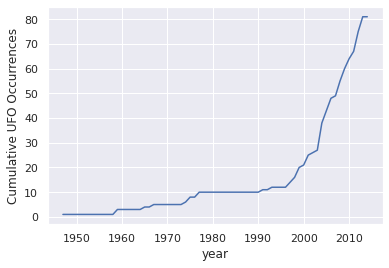

In [28]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
ufo_one_city = ufo_df_cum[ufo_df_cum['city']=='minneapolis']
ax = sns.lineplot(x="year", y=column_of_interst, data=ufo_one_city)
# ufo_one_city

**Finally, like requests, let's show the UFO occurrences history using a map over the years.**

In [29]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

date_column = 'year'
data_to_viz = ufo_df_cum.copy()

# For focuing on the correct area, I calculated the maximumn and minimum 
# latitude and longitude and give an epsilon value
eps = 0.1
max_lat = data_to_viz['latitude'].max()
min_lat = data_to_viz['latitude'].min()
min_lon = data_to_viz['longitude'].min()
max_lon = data_to_viz['longitude'].max()

fig = px.scatter_geo(data_to_viz, 
                     lat='latitude', 
                     lon='longitude', 
                     scope='usa',
                     hover_data = ['city'],
                     size_max = 50,
                     color=column_of_interst,
                     size=column_of_interst,
                     animation_frame=date_column)

fig.update_layout(
        title_text = f'{column_of_interst} over time in {selected_state_full}',
        showlegend = True,
        geo = go.layout.Geo(
            resolution = 50,
            scope = 'world',
            showframe = False,
            showcoastlines = True,
            landcolor = "rgb(229, 229, 229)",
            countrycolor = "white" ,
            coastlinecolor = "white",
            projection_type = 'hammer',
            lonaxis_range= [min_lon - eps, max_lon + eps],
            lataxis_range= [min_lat - eps , max_lat + eps ]
        )
    )
fig.show()

## Question 2 - Part 2

In [30]:
ufo_df

,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year
71,1997-10-10 21:00:00,austin,mn,us,other,3600,1-hour,i was traveling northbound on state highway 10...,1/28/1999,43.6666667,-92.974444,1997
139,2004-10-10 21:00:00,faribault,mn,us,flash,900,1/2 hour,Metor or craft descending then sudden flash of...,10/27/2004,44.2950000,-93.268611,2004
153,2005-10-10 23:07:00,brainerd,mn,us,disk,300,5 min.,A big lighted up silver saucer.,10/30/2006,46.3580556,-94.200556,2005
179,2007-10-10 22:00:00,duluth,mn,us,light,600,10 minutes,Bright pulsating light over lake superior.,1/21/2008,46.7833333,-92.106389,2007
186,2008-10-10 02:00:00,north branch,mn,us,light,300,5 min,Lights at night&#44 shining into car and garag...,10/31/2008,45.5113889,-92.980000,2008
...,...,...,...,...,...,...,...,...,...,...,...,...
79853,2013-09-07 13:00:00,cass lake,mn,us,oval,10,10 seconds,High altitude and speed oval object. Disappear...,9/9/2013,47.3794444,-94.603889,2013
80001,2009-09-08 20:30:00,ely,mn,us,other,300,5 min,star like crafts moving at high rate of speed...,12/12/2009,47.9033333,-91.866944,2009
80004,2009-09-08 21:00:00,isanti,mn,us,formation,300,5 minutes,2 Strange lights in a line formation. ((NUFOR...,12/12/2009,45.4902778,-93.247500,2009
80199,2005-09-09 19:00:00,nodine,mn,us,light,15,15 seconds,orange ball of light in the horizon moving rap...,10/11/2005,43.9050000,-91.436111,2005


Filter some columns and lower the comments column

In [31]:
import nltk
import turicreate as tc
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

nltk.download('punkt') # need to download punkt package from NLTK
nltk.download('stopwords')
stop_words_set = set(stopwords.words("english"))

ufo_sf = tc.SFrame(ufo_df[['datetime', 'city', 'comments']])
ufo_sf['text'] = ufo_sf.apply(lambda r: r['comments'].lower())
ufo_sf

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


datetime,city,comments,text
1997-10-10 21:00:00+00:00,austin,i was travelingnorthbound on state ...,i was travelingnorthbound on state ...
2004-10-10 21:00:00+00:00,faribault,Metor or craft descendingthen sudden flash of ...,metor or craft descendingthen sudden flash of ...
2005-10-10 23:07:00+00:00,brainerd,A big lighted up silversaucer. ...,a big lighted up silversaucer. ...
2007-10-10 22:00:00+00:00,duluth,Bright pulsating lightover lake superior. ...,bright pulsating lightover lake superior. ...
2008-10-10 02:00:00+00:00,north branch,Lights at night&#44shining into car and ...,lights at night&#44shining into car and ...
2008-10-10 20:00:00+00:00,la crescent,six strange lights in thesky over La Crescent MN ...,six strange lights in thesky over la crescent mn ...
2013-10-10 20:30:00+00:00,savage,I saw a sphere shapedobject flying east to ...,i saw a sphere shapedobject flying east to ...
1987-10-11 21:30:00+00:00,minnetonka,White light moves west toeast&#44 suddenly ...,white light moves west toeast&#44 suddenly ...
2003-10-11 00:20:00+00:00,austin,THE TWO WHITE ROUNDOBJECTS FLEW SYNCHONIZED ...,the two white roundobjects flew synchonized ...
2005-10-11 03:00:00+00:00,eagan,((NUFORC Note: Possiblestar. PD)) Bright ...,((nuforc note: possiblestar. pd)) bright ...


**The first thing I want to do is to create a word cloud and using these words cloud to understand what are the frequent words in the data.**

*Note: I filtered stop words and used a steamer.*

As you can see below, the words object, sky, and light.

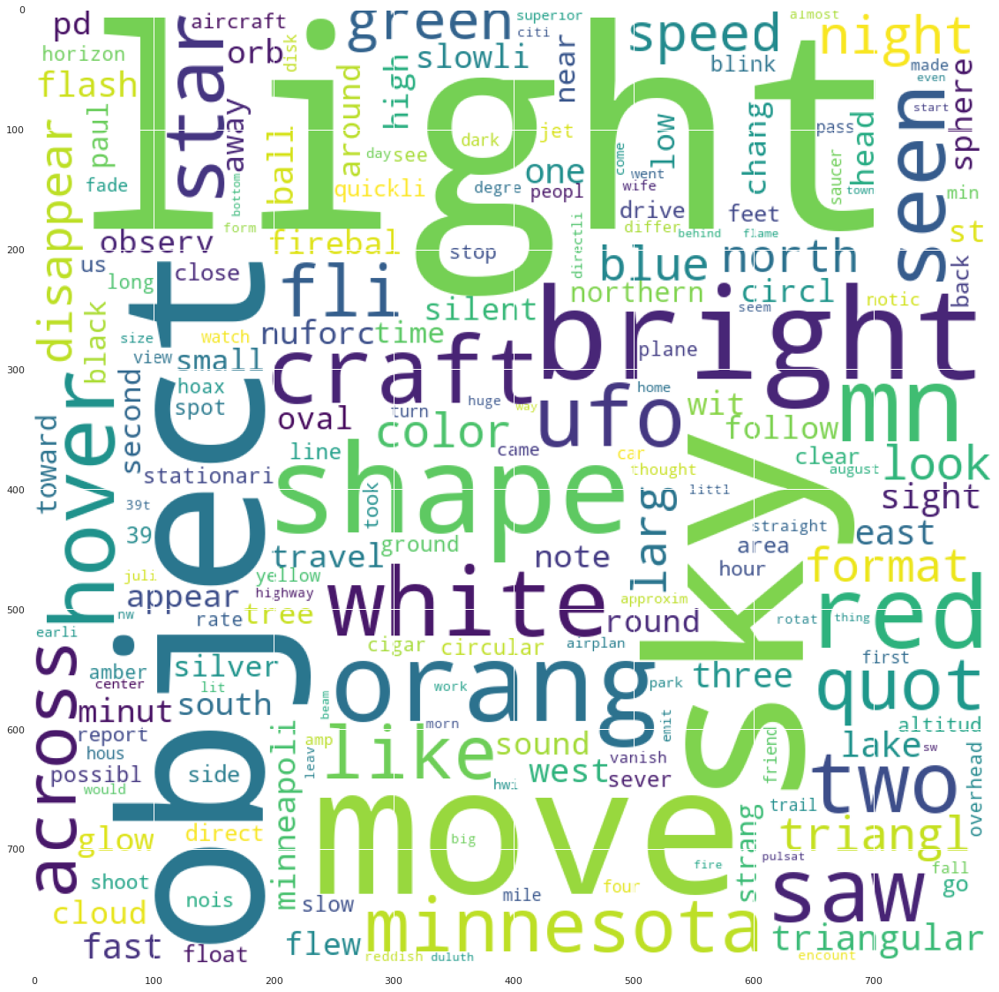

In [32]:
from wordcloud import WordCloud
from collections import Counter
import matplotlib.pyplot as plt
import re
from nltk.stem.porter import *
stemmer = PorterStemmer()

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10)

def skip_word2(w):
    if len(w) <2:
        return True
    if w.isdigit():
        return True
    if w in stop_words_set or stemmer.stem(w) in stop_words_set:
        return True
    return False

docs = ufo_sf['text'].apply(lambda txt: ' '.join([stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word2(w)]))
txt = "\n".join(docs)
words = word_tokenize(txt)
bigrams = [w1 for w1 in words]

c = Counter(bigrams)
wordcloud.generate_from_frequencies(c)
plt.figure(figsize = (20, 20), facecolor = None) 
plt.imshow(wordcloud)

**The second thing I wanted to try is to create a topic model, similar to what showed in lectures six and seven.**

A topic model is a statistical model for discovering the abstract topics that occur in a collection of documents.
Topic model algorithms are used to discover hidden subjects in a large collection of unstructured texts.


**I *italicized text* use Gensim to construct a topic model and then display the topics using pyLDAvis.**

In [33]:
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel


docs = ufo_sf['text'].apply(lambda txt: [stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word2(w)])
docs = docs.apply(lambda l: [w for w in l if not skip_word2(w)])

# Converting the data to work in Gensim
# see also https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
id2word = corpora.Dictionary(docs)
corpus = [id2word.doc2bow(text) for text in docs]
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1)]]


In [34]:
num_topics=10
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           update_every=0,
                                           chunksize=500,
                                           alpha='auto',
                                           per_word_topics=True)

**For each topic (out of 10 topics), this visualiztion show what are the terms that are represent the topic.**

In [35]:
import pyLDAvis
import pyLDAvis.gensim as gensimvis
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.020470 -0.015797       1        1  19.213947
3     -0.012655 -0.056444       2        1  11.245790
0     -0.018567  0.049148       3        1  10.729783
1     -0.022029 -0.025607       4        1  10.510249
4      0.000466 -0.061295       5        1  10.503693
8     -0.098198  0.083344       6        1  10.400496
9     -0.020715 -0.053754       7        1   8.990909
2      0.070308 -0.000438       8        1   7.555239
7      0.025304  0.019160       9        1   5.606324
6      0.096558  0.061683      10        1   5.243568, topic_info=       Term        Freq       Total Category  logprob  loglift
42     move  163.000000  163.000000  Default  30.0000  30.0000
242    quot   57.000000   57.000000  Default  29.0000  29.0000
9    object  200.000000  200.000000  Default  28.0000  28.0000
46    shape  138.000000  138.000000  Default  27.0000  27.0000
197   green   56.000000   56.000000  Default  26.0000  26.0000
..      ...         ...         ...      ...      ...      ...
98    sight    2.945923   40.672001  Topic10  -5.1527   0.3231
173    look    2.945518   43.190617  Topic10  -5.1529   0.2628
206  slowli    2.725325   32.495659  Topic10  -5.2306   0.4696
43    orang    2.958806  113.293350  Topic10  -5.1484  -0.6970
49    white    2.565968   85.781319  Topic10  -5.2908  -0.5613

[768 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
1340      5  0.574434    00hour
1307     10  0.643160       00p
1394      4  0.600822      0ink
1257      7  0.595596    1145pm
1563      3  0.604223      21st
...     ...       ...       ...
244       5  0.306689    yellow
244       8  0.230017    yellow
1256      1  0.576932  yellowin
1492      7  0.595586      zero
764       4  0.802403      zoom

[1607 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 1, 2, 5, 9, 10, 3, 8, 7])

In [36]:
x=lda_model.show_topics(num_topics=num_topics, num_words=20,formatted=False)
topics_words = {tp[0]:[wd[0] for wd in tp[1]] for tp in x}
topics_words[0]

['light',
 'sky',
 'move',
 'object',
 'star',
 'orang',
 'mn',
 'quot',
 'blue',
 'red',
 'shape',
 'south',
 'like',
 'bright',
 'ufo',
 'east',
 'north',
 'flash',
 'minut',
 'wit']

**Then, for each UFO occurrence, I find the most relevant topic.**

In [37]:
from gensim import corpora, models

id2word = corpora.Dictionary(docs)
corpus = [id2word.doc2bow(text) for text in docs]

rel_topics = []

for doc in docs:
  # topics_per_doc = []
  d = ' '.join(doc)
  bow = id2word.doc2bow(d.split())
  t = lda_model.get_document_topics(bow)
  # topics_per_doc.append(t)
  rel_topics.append(t)

print(f'Number of records is {len(rel_topics)}')


Number of records is 1081


Create dataframe for each topic

In [38]:
topics = [i[0][0] for i in rel_topics]
ufo_sf['topic'] = topics
ufo_df_topics = ufo_sf.to_dataframe()
ufo_df_topics_gb = ufo_df_topics[['topic', 'text']].groupby(['topic']).count()
ufo_df_topics_gb = ufo_df_topics_gb.reset_index()
ufo_df_topics_gb = ufo_df_topics_gb.sort_values(by=['topic'])
ufo_df_topics_gb['keywords'] = ufo_df_topics_gb.apply(lambda x: ', '.join(topics_words[int(x['topic'])]), axis=1)
ufo_df_topics_gb['topic_name'] = ufo_df_topics_gb.apply(lambda x: 'Topic: #' + str(x['topic']), axis=1)
ufo_df_topics_gb['labels'] = ufo_df_topics_gb.apply(lambda x: str(x['topic']) + ' Keywords: ' + x['keywords'], axis=1)
ufo_df_topics_gb

,topic,text,keywords,topic_name,labels
0,0,341,"light, sky, move, object, star, orang, mn, quo...",Topic: #0,"0 Keywords: light, sky, move, object, star, or..."
1,1,91,"light, sky, quot, move, bright, object, mn, la...",Topic: #1,"1 Keywords: light, sky, quot, move, bright, ob..."
2,2,69,"shape, light, object, mn, orang, fli, hover, s...",Topic: #2,"2 Keywords: shape, light, object, mn, orang, f..."
3,3,99,"light, sky, bright, shape, object, move, white...",Topic: #3,"3 Keywords: light, sky, bright, shape, object,..."
4,4,95,"light, move, red, bright, green, fast, orang, ...",Topic: #4,"4 Keywords: light, move, red, bright, green, f..."
5,5,228,"light, sky, object, orang, two, bright, shape,...",Topic: #5,"5 Keywords: light, sky, object, orang, two, br..."
6,6,26,"light, bright, move, sky, shape, object, craft...",Topic: #6,"6 Keywords: light, bright, move, sky, shape, o..."
7,7,30,"object, sky, bright, move, light, look, green,...",Topic: #7,"7 Keywords: object, sky, bright, move, light, ..."
8,8,54,"light, move, mn, object, white, note, pd, nufo...",Topic: #8,"8 Keywords: light, move, mn, object, white, no..."
9,9,48,"light, shape, sky, move, object, ufo, mn, acro...",Topic: #9,"9 Keywords: light, shape, sky, move, object, u..."


In [39]:
ufo_df_topics

,datetime,city,comments,text,topic
0,1997-10-10 21:00:00+00:00,austin,i was traveling northbound on state highway 10...,i was traveling northbound on state highway 10...,0
1,2004-10-10 21:00:00+00:00,faribault,Metor or craft descending then sudden flash of...,metor or craft descending then sudden flash of...,5
2,2005-10-10 23:07:00+00:00,brainerd,A big lighted up silver saucer.,a big lighted up silver saucer.,0
3,2007-10-10 22:00:00+00:00,duluth,Bright pulsating light over lake superior.,bright pulsating light over lake superior.,0
4,2008-10-10 02:00:00+00:00,north branch,Lights at night&#44 shining into car and garag...,lights at night&#44 shining into car and garag...,1
...,...,...,...,...,...
1076,2013-09-07 13:00:00+00:00,cass lake,High altitude and speed oval object. Disappear...,high altitude and speed oval object. disappear...,5
1077,2009-09-08 20:30:00+00:00,ely,star like crafts moving at high rate of speed...,star like crafts moving at high rate of speed...,8
1078,2009-09-08 21:00:00+00:00,isanti,2 Strange lights in a line formation. ((NUFOR...,2 strange lights in a line formation. ((nufor...,8
1079,2005-09-09 19:00:00+00:00,nodine,orange ball of light in the horizon moving rap...,orange ball of light in the horizon moving rap...,1


Create a similarity dataframe for the next part

In [40]:
import copy 

def Merge(dict1, dict2): 
  res = {**dict1, **dict2} 
  return res 

def convert(tup, di): 
    di = dict(tup) 
    return di 

def to_integer(dt_time):
    return 10000*dt_time.year + 100*dt_time.month + dt_time.day

starting_index = {}
ending_index = {}
rec_for_sim = Merge({'datetime': [], 'latitude': [], 'longitude':[], 'duration': [], 'city': [], 'state': []}, {k:[] for k in range(num_topics)})
starting_index[selected_state] = len(rec_for_sim['state'])
ufo_df = ufo_df.reset_index()
for index, row in ufo_df.iterrows():
  top_dict = convert(rel_topics[index], {})
  rec_for_sim['state'].append(selected_state)
  rec_for_sim['city'].append(row['city'])
  rec_for_sim['latitude'].append(row['latitude'])
  rec_for_sim['longitude'].append(row['longitude'])
  rec_for_sim['duration'].append(row['duration (seconds)'])
  rec_for_sim['datetime'].append(to_integer(row['datetime']))
  for k in range(num_topics):
    if k not in top_dict:
      rec_for_sim[k].append(0)
    else:
      rec_for_sim[k].append(top_dict[k])
ending_index[selected_state] = len(rec_for_sim['state'])

rec_for_sim_only_state = copy.deepcopy(rec_for_sim)

In [41]:
sim_df = pd.DataFrame.from_dict(rec_for_sim)
references = tc.SFrame(sim_df)
model = tc.nearest_neighbors.create(references)
g = model.similarity_graph(k=1)

Defaulting to brute force instead of ball tree because there are multiple distance components.


Starting brute force nearest neighbors model training.

Validating distance components.

Initializing model data.

Initializing distances.

Done.

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 1            | 1081    | 0.0925069   | 9.332ms      |

| Done         |         | 100         | 1.58s        |

+--------------+---------+-------------+--------------+

In [42]:
sim_df

,datetime,latitude,longitude,duration,city,state,0,1,2,3,4,5,6,7,8,9
0,19971010,43.6666667,-92.974444,3600,austin,mn,0.958411,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,20041010,44.2950000,-93.268611,900,faribault,mn,0.000000,0.000000,0.000000,0.000000,0.000000,0.918719,0.000000,0.000000,0.010251,0.000000
2,20051010,46.3580556,-94.200556,300,brainerd,mn,0.877569,0.013433,0.012915,0.013354,0.012922,0.019596,0.011529,0.011102,0.014679,0.012900
3,20071010,46.7833333,-92.106389,600,duluth,mn,0.011144,0.011047,0.010622,0.899153,0.010627,0.016116,0.000000,0.000000,0.012072,0.010609
4,20081010,45.5113889,-92.980000,300,north branch,mn,0.000000,0.925632,0.000000,0.000000,0.000000,0.011892,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,20130907,47.3794444,-94.603889,10,cass lake,mn,0.000000,0.000000,0.000000,0.000000,0.000000,0.944043,0.000000,0.000000,0.000000,0.000000
1077,20090908,47.9033333,-91.866944,300,ely,mn,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.961613,0.000000
1078,20090908,45.4902778,-93.247500,300,isanti,mn,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.951710,0.000000
1079,20050909,43.9050000,-91.436111,15,nodine,mn,0.000000,0.934252,0.000000,0.000000,0.000000,0.010514,0.000000,0.000000,0.000000,0.000000


**Lastly, visualize the Pie Chart of the Distribution of Topics in the Description of UFO sighting in Michigan**

In [43]:
import plotly.graph_objects as go

fig = go.Figure(go.Pie(
    name = "",
    values = list(ufo_df_topics_gb['text']),
    labels = list(ufo_df_topics_gb['topic_name']),
    text = list(ufo_df_topics_gb['topic_name']),
    customdata = list(ufo_df_topics_gb['keywords']),
    hovertemplate = "Topic %{label}: <br>Popularity: %{percent} </br>Keywords of Topic: %{customdata}"
))

fig.update_layout(title_text=f'Distribution of Topics in the Description of UFO sighting in {selected_state_full}')
fig.show()

## Question 2 - Part 3

For each sighting with UFO in 'Ohio', 'Indiana', 'Illinois', 'Wisconsin', find the most similar topic.

In [44]:
neighboring_countries = ['oh', 'in', 'il', 'wi']
neighboring_countries_names = ['Ohio', 'Indiana', 'Illinois', 'Wisconsin']
neighboring_countries_df_list = []

nc_ufo_df = pd.read_csv(FILE_TO_READ, low_memory=False)

for state in neighboring_countries:
  # This file is similar to the complete.csv file but with more filters
  nc_ufo_df_state = nc_ufo_df[nc_ufo_df['state'] == state]  # filter non relevant states
  nc_ufo_df_state['comments'] =  nc_ufo_df_state['comments'].astype(str)
  nc_ufo_df_state['text'] = nc_ufo_df_state.apply(lambda r: r['comments'].lower(), axis=1)

  docs = nc_ufo_df_state['text'].apply(lambda txt: [stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word2(w)])
  docs = docs.apply(lambda l: [w for w in l if not skip_word2(w)])

  topicsa = []

  for doc in docs:
    d = ' '.join(doc)
    bow = id2word.doc2bow(d.split())
    t = lda_model.get_document_topics(bow)
    topicsa.append(t)

  print(f'Number of records is {len(topicsa)}')
  topics = [i[0][0] for i in topicsa]
  nc_ufo_df_state = nc_ufo_df_state.reset_index()
  nc_ufo_df_state['topic'] = topics
  nc_ufo_df_state[['date','time']] = nc_ufo_df_state['datetime'].str.split(expand=True)
  nc_ufo_df_state['datetime'] = (pd.to_datetime(nc_ufo_df_state.pop('date'), format='%m/%d/%Y') + 
                        pd.to_timedelta(nc_ufo_df_state.pop('time') + ':00'))
  nc_ufo_df_state['datetime'] = pd.to_datetime(nc_ufo_df_state['datetime'])

  if len(nc_ufo_df_state) != len(topicsa):
    raise Exception('problem')
  
  starting_index[state] = len(rec_for_sim['state'])
  for i, row in nc_ufo_df_state.iterrows():
    top_dict = convert(topicsa[i], {})
    rec_for_sim['state'].append(state)
    rec_for_sim['city'].append(row['city'])
    rec_for_sim['datetime'].append(to_integer(row['datetime']))
    rec_for_sim['latitude'].append(row['latitude'])
    rec_for_sim['longitude'].append(row['longitude '])
    rec_for_sim['duration'].append(row['duration (seconds)'])
    for k in range(num_topics):
      if k not in top_dict:
        rec_for_sim[k].append(0)
      else:
        rec_for_sim[k].append(top_dict[k])
  ending_index[state] = len(rec_for_sim['state'])

  nc_ufo_df_state_gb = nc_ufo_df_state[['topic', 'text']].groupby(['topic']).count()
  nc_ufo_df_state_gb = nc_ufo_df_state_gb.reset_index()
  nc_ufo_df_state_gb = nc_ufo_df_state_gb.sort_values(by=['topic'])
  nc_ufo_df_state_gb['keywords'] = nc_ufo_df_state_gb.apply(lambda x: ', '.join(topics_words[int(x['topic'])]), axis=1)
  nc_ufo_df_state_gb['topic_name'] = nc_ufo_df_state_gb.apply(lambda x: 'Topic: #' + str(x['topic']), axis=1)
  nc_ufo_df_state_gb['labels'] = nc_ufo_df_state_gb.apply(lambda x: str(x['topic']) + ' Keywords: ' + x['keywords'], axis=1)
  neighboring_countries_df_list.append(nc_ufo_df_state_gb)



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Number of records is 2425
Number of records is 1386
Number of records is 2645
Number of records is 1333


Testing the restuls

In [45]:
neighboring_countries_df_list[3]

,topic,text,keywords,topic_name,labels
0,0,611,"light, sky, move, object, star, orang, mn, quo...",Topic: #0,"0 Keywords: light, sky, move, object, star, or..."
1,1,133,"light, sky, quot, move, bright, object, mn, la...",Topic: #1,"1 Keywords: light, sky, quot, move, bright, ob..."
2,2,102,"shape, light, object, mn, orang, fli, hover, s...",Topic: #2,"2 Keywords: shape, light, object, mn, orang, f..."
3,3,126,"light, sky, bright, shape, object, move, white...",Topic: #3,"3 Keywords: light, sky, bright, shape, object,..."
4,4,106,"light, move, red, bright, green, fast, orang, ...",Topic: #4,"4 Keywords: light, move, red, bright, green, f..."
5,5,230,"light, sky, object, orang, two, bright, shape,...",Topic: #5,"5 Keywords: light, sky, object, orang, two, br..."
6,6,10,"light, bright, move, sky, shape, object, craft...",Topic: #6,"6 Keywords: light, bright, move, sky, shape, o..."
7,7,6,"object, sky, bright, move, light, look, green,...",Topic: #7,"7 Keywords: object, sky, bright, move, light, ..."
8,8,5,"light, move, mn, object, white, note, pd, nufo...",Topic: #8,"8 Keywords: light, move, mn, object, white, no..."
9,9,4,"light, shape, sky, move, object, ufo, mn, acro...",Topic: #9,"9 Keywords: light, shape, sky, move, object, u..."


Distribution of Topics in the Description of UFO sighting in Michigan and Michigan's Neighbor States.

In [46]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

labels = list(ufo_df_topics_gb['topic_name'])

fig = make_subplots(1, 5, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=[f'My state: {selected_state_full}'] + neighboring_countries_names)
fig.add_trace(go.Pie(labels=labels, values=list(ufo_df_topics_gb['text']), scalegroup='one',
                     name=""), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=list(neighboring_countries_df_list[0]['text']), scalegroup='one',
                     name=""), 1, 2)
fig.add_trace(go.Pie(labels=labels, values=list(neighboring_countries_df_list[1]['text']), scalegroup='one',
                     name=""), 1, 3)
fig.add_trace(go.Pie(labels=labels, values=list(neighboring_countries_df_list[2]['text']), scalegroup='one',
                     name=""), 1, 4)
fig.add_trace(go.Pie(labels=labels, values=list(neighboring_countries_df_list[3]['text']), scalegroup='one',
                     name=""), 1, 5)

fig.update_layout(title_text=f'Distribution of Topics in the Description of UFO sighting in {selected_state_full} and {selected_state_full}\'s Neighbor States (i.e., {", ".join(neighboring_countries_names)})')
fig.show()

Compute k-nearest-neighbors (k=1) and create a graph

In [47]:
sim_df = pd.DataFrame.from_dict(rec_for_sim)
references = tc.SFrame(sim_df)
model = tc.nearest_neighbors.create(references)
g = model.similarity_graph(k=1)

Defaulting to brute force instead of ball tree because there are multiple distance components.


Starting brute force nearest neighbors model training.

Validating distance components.

Initializing model data.

Initializing distances.

Done.

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 1            | 8870    | 0.011274    | 48.224ms     |

| 230          | 2040100 | 2.59301     | 3.05s        |

| 465          | 4124550 | 5.24239     | 6.04s        |

| 700          | 6209000 | 7.89177     | 9.06s        |

| 935          | 8293450 | 10.5411     | 12.05s       |

| 1178         | 1e+07   | 13.2807     | 15.05s       |

| 1420         | 1.3e+07 | 16.009      | 18.05s       |

| 1666         | 1.5e+07 | 18.7824     | 21.06s       |

| 1911         | 1.7e+07 | 21.5445     | 24.05s       |

| 2153         | 1.9e+07 | 24.2728     | 27.05s       |

| 2399         | 2.1e+07 | 27.0462     | 30.05s       |

| 2646         | 2.3e+07 | 29.8309     | 33.06s       |

| 2892         | 2.6e+07 | 32.6043     | 36.06s       |

| 3138         | 2.8e+07 | 35.3777     | 39.07s       |

| 3382         |         | 38.1285     | 42.05s       |

| 3629         | 3.2e+07 | 40.9132     | 45.06s       |

| 3872         | 3.4e+07 | 43.6528     | 48.07s       |

| 4119         | 3.7e+07 | 46.4374     | 51.06s       |

| 4364         | 3.9e+07 | 49.1995     | 54.07s       |

| 4607         | 4.1e+07 | 51.9391     | 57.06s       |

| 4854         | 4.3e+07 | 54.7238     | 1m 0s        |

| 5098         | 4.5e+07 | 57.4746     | 1m 3s        |

| 5344         | 4.7e+07 | 60.248      | 1m 6s        |

| 5586         | 5e+07   | 62.9763     | 1m 9s        |

| 5832         | 5.2e+07 | 65.7497     | 1m 12s       |

| 6072         | 5.4e+07 | 68.4555     | 1m 15s       |

| 6318         | 5.6e+07 | 71.2289     | 1m 18s       |

| 6563         | 5.8e+07 | 73.991      | 1m 21s       |

| 6808         | 6e+07   | 76.7531     | 1m 24s       |

| 7051         | 6.3e+07 | 79.4927     | 1m 27s       |

| 7285         | 6.5e+07 | 82.1308     | 1m 30s       |

| 7523         | 6.7e+07 | 84.814      | 1m 33s       |

| 7761         | 6.9e+07 | 87.4972     | 1m 36s       |

| 7997         | 7.1e+07 | 90.1578     | 1m 39s       |

| 8236         | 7.3e+07 | 92.8523     | 1m 42s       |

| 8474         | 7.5e+07 | 95.5355     | 1m 45s       |

| 8703         | 7.7e+07 | 98.1172     | 1m 48s       |

| Done         |         | 100         | 1m 50s       |

+--------------+---------+-------------+--------------+

Convert to networkx

In [48]:
import networkx as nx 

def sgraph2nxgraph(sgraph, is_directed=True, add_vertices_attributes=True, add_edges_attributes=True):
    if is_directed:
        nx_g = nx.DiGraph()
    else:
        nx_g = nx.Graph()
    if add_vertices_attributes:
        vertices = [(r['__id'] , r) for r in sgraph.vertices]
    else:
        vertices = list(sgraph.get_vertices()['__id'])

    if add_edges_attributes:
        edges = [(r['__src_id'], r['__dst_id'], r) for r in sgraph.edges]
    else:
        edges = [(e['__src_id'], e['__dst_id']) for e in sgraph.get_edges()]
    nx_g.add_nodes_from(vertices)
    nx_g.add_edges_from(edges)
    return nx_g

h = sgraph2nxgraph(g, is_directed=True,
                      add_vertices_attributes=True,
                      add_edges_attributes=True)

Make sure the cases are not from the same state, and the distance is relatively close (15 units).

In [49]:
def same_state(u_id, v_id):
  list_of_states = [selected_state] + neighboring_countries
  for st in list_of_states:
    # print(f'starting index {starting_index[st]}, ending index {ending_index[st]}')
    # print(f'u_id {u_id}, v_id {v_id}')
    if starting_index[st] < int(u_id) < ending_index[st] and starting_index[st] < int(v_id) < ending_index[st]:
      return True
  return False

selected_edges = [(u,v, e) for u,v,e in h.edges(data=True) if e['distance'] < 15 and not same_state(u, v)]
print(len(selected_edges))
selected_edges[0][2]

117


{'__dst_id': 8353, '__src_id': 678, 'distance': 13.516033670347946, 'rank': 1}

Add a description to the edges

In [50]:
for i in range(len(selected_edges)):
  u = selected_edges[i][0]
  u_name = f"City {sim_df.iloc[u]['city']} State: {sim_df.iloc[u]['state']}"
  v = selected_edges[i][1]
  v_name = f"City: {sim_df.iloc[v]['city']} State: {sim_df.iloc[v]['state']}"
  dist = '{:.2f}'.format(selected_edges[i][2]['distance'])
  selected_edges[i][2]['distance'] = f'{u_name} AND {v_name} DISTANCE: {dist}'

In [51]:
sim_df.iloc[5]

datetime        20081010
latitude      43.8280556
longitude       -91.3039
duration              10
city         la crescent
state                 mn
0                      0
1                      0
2                      0
3                      0
4                      0
5               0.929371
6                      0
7                      0
8                      0
9                      0
Name: 5, dtype: object

Plot the graph

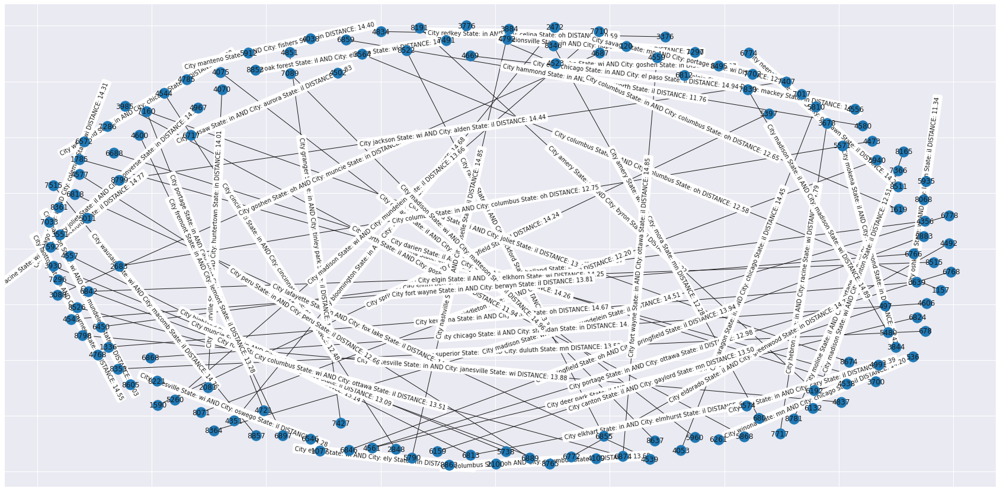

In [52]:
H = nx.Graph()
H.add_edges_from(selected_edges)
plt.figure(figsize=(30,15))

pos = nx.spring_layout(H, k=5)
nx.draw_networkx(H,pos)
labels = nx.get_edge_attributes(H,'distance')
nx.draw_networkx_edge_labels(H,pos,edge_labels=labels);

## Question 2 - Part 4



Use KNN with K=10, but only in Michigan

In [53]:
sim_df_state = pd.DataFrame.from_dict(rec_for_sim_only_state)
references_state = tc.SFrame(sim_df_state)
model_state = tc.nearest_neighbors.create(references_state)
g_state = model_state.similarity_graph(k=10)

Defaulting to brute force instead of ball tree because there are multiple distance components.


Starting brute force nearest neighbors model training.

Validating distance components.

Initializing model data.

Initializing distances.

Done.

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 1            | 1081    | 0.0925069   | 7.185ms      |

| Done         |         | 100         | 1.65s        |

+--------------+---------+-------------+--------------+

Make sure the cases are relatively close (100 units)

In [54]:
h_anom = sgraph2nxgraph(g_state, is_directed=True, add_vertices_attributes=True,
                      add_edges_attributes=True)
selected_edges_anom = [(u,v, e) for u,v,e in h_anom.edges(data=True) if e['distance'] < 100]
print(len(selected_edges_anom))
selected_edges_anom[0][2]

6268


{'__dst_id': 73, '__src_id': 5, 'distance': 40.06457298013652, 'rank': 3}

Plot the graph

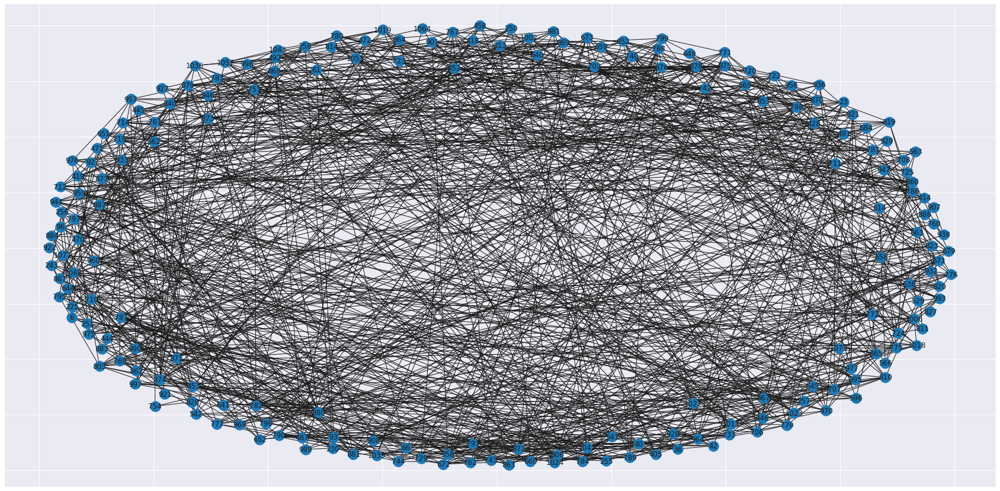

In [55]:
H_anom = nx.Graph()
H_anom.add_edges_from(selected_edges_anom)

l = [n for n,degree in dict(H_anom.degree()).items() if degree > 10]
H_anom_deg = H_anom.subgraph(l)

plt.figure(figsize=(30,15))

pos = nx.spring_layout(H_anom_deg, k=5)
nx.draw_networkx(H_anom_deg,pos)
# labels = nx.get_edge_attributes(H_anom,'distance')
# nx.draw_networkx_edge_labels(H_anom,pos,edge_labels=labels);

Find the ten nodes with the highest degree.

In [56]:
import operator
anom_deg_op = sorted(dict(H_anom_deg.degree()).items(), key=operator.itemgetter(1), reverse=True)
anom_deg_dict = {k[0]:k[1] for k in anom_deg_op[:10]}
anom_indeices = anom_deg_dict.keys()
print(f'Dictionary of network degree: {anom_deg_dict}')
print(f'All the relevant records from the data frame:')
ufo_df_anom = ufo_df.reset_index()
ufo_df_anom = ufo_df_anom[ufo_df_anom.index.isin(list(anom_indeices))]
ufo_df_anom

Dictionary of network degree: {879: 18, 874: 16, 869: 15, 873: 15, 875: 15, 880: 15, 868: 14, 872: 14, 706: 13, 707: 13}
All the relevant records from the data frame:


,level_0,index,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year
706,706,57422,2010-07-16 20:00:00,duluth,mn,us,disk,60,about 1 min,Black disk shaped object moves noiselessly thr...,7/19/2010,46.7833333,-92.106389,2010
707,707,57433,2010-07-16 23:30:00,prior lake,mn,us,fireball,240,4 min. approx.,Four of us saw a phenomenon of about 12 reddis...,7/19/2010,44.7133333,-93.422500,2010
868,868,67686,2004-08-19 11:00:00,st. paul,mn,us,unknown,600,10 minutes,ON Aug. 19th about 11am I was heading south on...,1/19/2005,44.9444444,-93.093056,2004
869,869,67687,2004-08-19 13:00:00,minneapolis,mn,us,sphere,300,5 minutes,I seen an object in the sky&#44 thought it was...,12/3/2004,44.9800000,-93.263611,2004
872,872,67691,2004-08-19 16:00:00,minneapolis,mn,us,circle,7200,2 hours,large object minneapolis baffles experts.,8/24/2004,44.9800000,-93.263611,2004
873,873,67692,2004-08-19 16:00:00,rosemount,mn,us,light,3600,1+ hours,Bright object in daytime sky&#44 MN,8/24/2004,44.7394444,-93.125556,2004
874,874,67693,2004-08-19 16:30:00,saint paul,mn,us,teardrop,3600,several hours,Strange object in Metro sky,9/9/2004,44.9444444,-93.093056,2004
875,875,67694,2004-08-19 17:00:00,chaska,mn,us,rectangle,16200,4.5 hours,Bright Object in skies above Minneapolis area&...,10/27/2004,44.7894444,-93.601944,2004
879,879,67698,2004-08-19 17:00:00,st. paul,mn,us,circle,14400,>=4 hrs,White circular object observed 2.5 handspans a...,9/1/2004,44.9444444,-93.093056,2004
880,880,67699,2004-08-19 17:00:00,st. paul,mn,us,light,10800,3 hours,Bright light hovers for hours in broad dayligh...,8/24/2004,44.9444444,-93.093056,2004


In [57]:
ufo_df['comment_length'] = ufo_df['comments'].apply(lambda x: len(x))
ufo_df['duration (seconds)']  = ufo_df['duration (seconds)'].astype(float)
ufo_df['shape'] = ufo_df['shape'].fillna('Other')
ufo_df

,index,datetime,city,state,country,shape,duration (seconds),duration (hours/min),comments,date posted,latitude,longitude,year,comment_length
0,71,1997-10-10 21:00:00,austin,mn,us,other,3600.0,1-hour,i was traveling northbound on state highway 10...,1/28/1999,43.6666667,-92.974444,1997,135
1,139,2004-10-10 21:00:00,faribault,mn,us,flash,900.0,1/2 hour,Metor or craft descending then sudden flash of...,10/27/2004,44.2950000,-93.268611,2004,52
2,153,2005-10-10 23:07:00,brainerd,mn,us,disk,300.0,5 min.,A big lighted up silver saucer.,10/30/2006,46.3580556,-94.200556,2005,31
3,179,2007-10-10 22:00:00,duluth,mn,us,light,600.0,10 minutes,Bright pulsating light over lake superior.,1/21/2008,46.7833333,-92.106389,2007,42
4,186,2008-10-10 02:00:00,north branch,mn,us,light,300.0,5 min,Lights at night&#44 shining into car and garag...,10/31/2008,45.5113889,-92.980000,2008,65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,79853,2013-09-07 13:00:00,cass lake,mn,us,oval,10.0,10 seconds,High altitude and speed oval object. Disappear...,9/9/2013,47.3794444,-94.603889,2013,87
1077,80001,2009-09-08 20:30:00,ely,mn,us,other,300.0,5 min,star like crafts moving at high rate of speed...,12/12/2009,47.9033333,-91.866944,2009,106
1078,80004,2009-09-08 21:00:00,isanti,mn,us,formation,300.0,5 minutes,2 Strange lights in a line formation. ((NUFOR...,12/12/2009,45.4902778,-93.247500,2009,96
1079,80199,2005-09-09 19:00:00,nodine,mn,us,light,15.0,15 seconds,orange ball of light in the horizon moving rap...,10/11/2005,43.9050000,-91.436111,2005,76


Comment Length versus the case duration. The color represents the shape, while the size represents the duration.

In [58]:
import plotly.express as px
fig = px.scatter(ufo_df, x="duration (seconds)", y="comment_length", size="duration (seconds)", color="shape",
           hover_name="shape", log_x=True, size_max=60, range_x = [100,250000])
fig.update_layout(title='Comment Length versus the case duration. The color represents the shape, while the size represents the duration.')
fig.show()

t-distributed stochastic neighbor embedding

In [59]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
import numpy as np
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import matplotlib.colors as mcolors

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 10
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1081 samples in 0.004s...
[t-SNE] Computed neighbors for 1081 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1081
[t-SNE] Computed conditional probabilities for sample 1081 / 1081
[t-SNE] Mean sigma: 0.000249
[t-SNE] KL divergence after 250 iterations with early exaggeration: 44.931175
[t-SNE] KL divergence after 1000 iterations: 0.094229


## Question 2 - Part 5

3-grams with words cloud

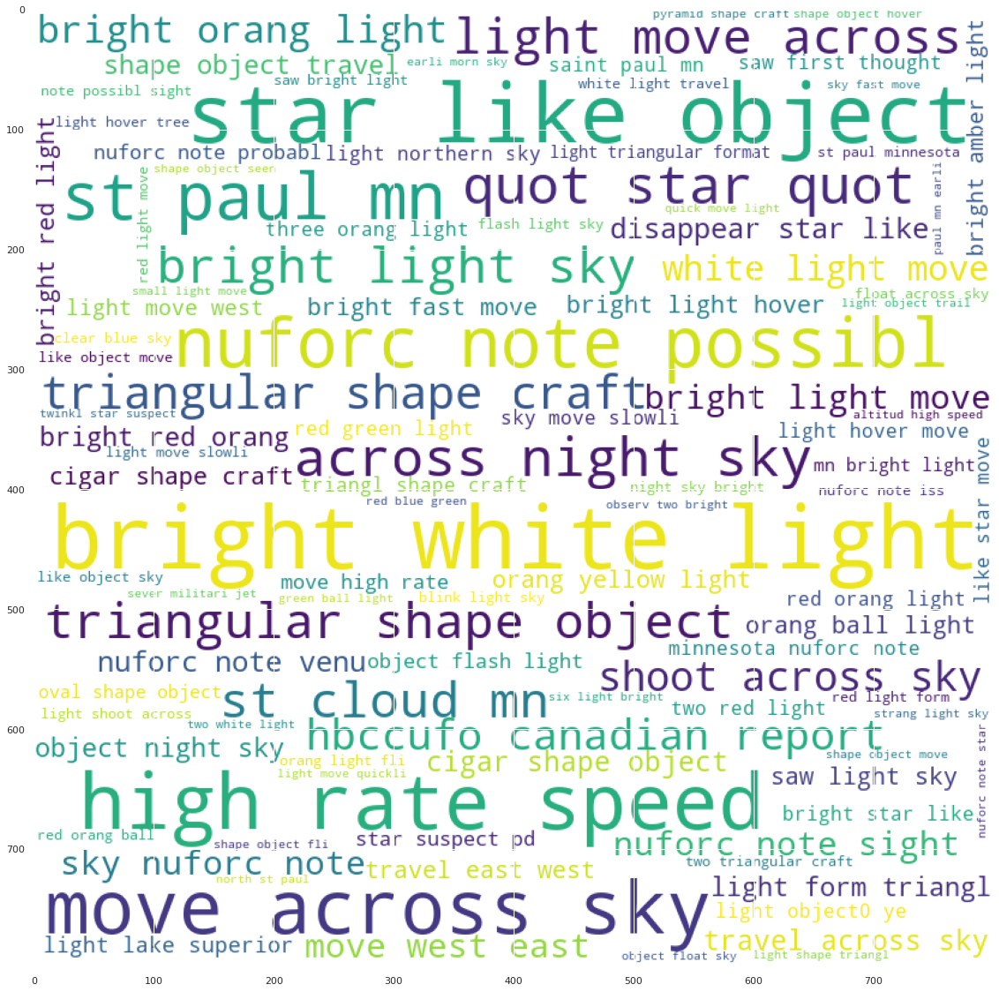

In [60]:
def get_most_common_bigrams(txt):
    words = word_tokenize(txt)
    bigrams = [f"{w1} {w2} {w3}" for w1,w2,w3 in zip(words, words[1:], words[2:])]

    c = Counter(bigrams)
    return c

docs = ufo_sf['text'].apply(lambda txt: ' '.join([stemmer.stem(w) for w in re.findall(r"(\w+)", txt) if not skip_word2(w)]))
txt = "\n".join(docs)

wordcloud.generate_from_frequencies(get_most_common_bigrams(txt))
plt.figure(figsize = (20, 20), facecolor = None) 
plt.imshow(wordcloud)

In [61]:
import spacy
nlp = spacy.load('en_core_web_lg')  # On Colab - Need to restart runtime before import the spacy package



/usr/local/lib/python3.6/dist-packages/_pytest/mark/structures.py:426: DeprecationWarning:

The usage of `cmp` is deprecated and will be removed on or after 2021-06-01.  Please use `eq` and `order` instead.



**Named-entity recognition**

In [62]:
from tqdm import tqdm
from collections import Counter


def get_locations(txt):
    links_set = set()
    doc = nlp(txt)
    l = []
    i = 0
    for location in doc.ents:
      if location.label_ == "LOC":
        loc_to_add = location.text.lower().strip()
        if i > 0:
          if l[i - 1] == loc_to_add:
            continue
        l.append(loc_to_add)
        i += 1
    return l

docs = ufo_sf['comments'].apply(lambda txt: ' '.join([w for w in re.findall(r"(\w+)", txt)]))
txt = "\n".join(docs)
txt = txt.replace("\n", " ")
locations_list = get_locations(txt)
locations_list_mc = Counter(locations_list).most_common(25)
locations_list_mc[0]

('west', 7)

Distribution of locations in the comments

In [63]:
import plotly.graph_objects as go

labels = [k[0] for k in locations_list_mc]
values = [k[1] for k in locations_list_mc]

# pull is given as a fraction of the pie radius
fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0.2, 0, 0])])
fig.update_layout(
    title={
        'text': "Distribution of locations in the comments",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

# Question 3

The data was downloaded from:
https://data.london.gov.uk/download/coronavirus-covid-19-mobility-report/57a99c05-d23c-44ea-a08e-0e18310e3b2d/activity_retail.csv'


In [64]:
import turicreate as tc
import pandas as pd

mob_data = 'https://data.london.gov.uk/download/coronavirus-covid-19-mobility-report/57a99c05-d23c-44ea-a08e-0e18310e3b2d/activity_retail.csv'
mob_df = pd.read_csv(mob_data)
mob_df

,location,activity,date,change,value,source
0,Greater London,Retail & recreation,2020-02-27,0.000000,100.000000,Google
1,Greater London,Grocery & pharmacy,2020-02-27,-1.000000,99.000000,Google
2,Greater London,Retail & recreation,2020-02-28,-2.000000,98.000000,Google
3,Greater London,Grocery & pharmacy,2020-02-28,-1.000000,99.000000,Google
4,Greater London,Retail & recreation,2020-02-29,-2.000000,98.000000,Google
...,...,...,...,...,...,...
488,Greater London,Social,2020-06-26,-93.266928,6.733072,Purple
489,Greater London,Social,2020-06-27,-94.229406,5.770594,Purple
490,Greater London,Social,2020-06-28,-95.010727,4.989273,Purple
491,Greater London,Social,2020-06-29,-92.966646,7.033354,Purple


Activity in London over time

In [65]:
import plotly.express as px

fig = px.line(mob_df, x="date", y="value", color='activity')
fig.update_layout(title='Activity in London over time')
fig.show()

Let's focus on Retail & recreation in London

In [66]:
def Merge(dict1, dict2): 
  res = {**dict1, **dict2} 
  return res 

mob_df = mob_df[mob_df['activity']=='Retail & recreation']
mob_df = mob_df[mob_df['location']=='Greater London']
mob_df = mob_df[mob_df['source']=='Google']
mob_df = mob_df.reset_index()
mob_df
# get features for the current date
based_on_prev_days = 10
dict_for_reg = Merge( Merge({'current_date': []}, {f'prev_{k}_day_val':[] for k in range(1, based_on_prev_days+1)}), {'current_val': []})
for i, row in mob_df.iterrows():
  if i < based_on_prev_days:
    continue
  dict_for_reg['current_date'].append(row['date'])
  dict_for_reg['current_val'].append(row['value'])
  for j in range(1, based_on_prev_days+1):
    prev_j_val = mob_df.iloc[i-j]['value']
    dict_for_reg[f'prev_{j}_day_val'].append(prev_j_val)

reg_df = pd.DataFrame.from_dict(dict_for_reg)
reg_tc = tc.SFrame(reg_df)
reg_tc

current_date,prev_1_day_val,prev_2_day_val,prev_3_day_val,prev_4_day_val,prev_5_day_val,prev_6_day_val
2020-03-08,98.0,101.0,91.0,97.0,99.0,102.0
2020-03-09,99.0,98.0,101.0,91.0,97.0,99.0
2020-03-10,97.0,99.0,98.0,101.0,91.0,97.0
2020-03-11,94.0,97.0,99.0,98.0,101.0,91.0
2020-03-12,94.0,94.0,97.0,99.0,98.0,101.0
2020-03-13,92.0,94.0,94.0,97.0,99.0,98.0
2020-03-14,87.0,92.0,94.0,94.0,97.0,99.0
2020-03-15,80.0,87.0,92.0,94.0,94.0,97.0
2020-03-16,76.0,80.0,87.0,92.0,94.0,94.0
2020-03-17,86.0,76.0,80.0,87.0,92.0,94.0


Make a linear regression model

In [67]:
sf_train, sf_test = reg_tc.random_split(.8, seed=2020)
features = [f'prev_{k}_day_val' for k in range(1, based_on_prev_days+1)]
model = tc.linear_regression.create(sf_train, target='current_val', features=features, validation_set='auto')

# Extract the coefficients
coefficients = model.coefficients

# Make predictions
predictions = model.predict(sf_test)
predictions

# Evaluate the model
results = model.evaluate(sf_test)
results

Linear regression:

--------------------------------------------------------

Number of examples          : 94

Number of features          : 10

Number of unpacked features : 10

Number of coefficients    : 11

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.001508     | 13.967568          | 3.263994                        |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

{'max_error': 8.234048582619096, 'rmse': 3.7646754706602956}

**For example, lets predict the mobility in the next 120 days using the regression model**

In [68]:
import datetime
predict_days_ahead = 120

prev_day = reg_tc[-1:][0]
prev_day['current_date'] = pd.to_datetime(prev_day['current_date'])
final_dict = {}

for i in range(1, predict_days_ahead+1):
  df_to_predict = Merge({'current_date': []}, {f'prev_{k}_day_val':[] for k in range(1, based_on_prev_days+1)})
  prev_day['current_date'] += datetime.timedelta(days=1)
  df_to_predict['current_date'].append(prev_day['current_date'])
  df_to_predict[f'prev_1_day_val'].append(prev_day['current_val'])
  for j in range(2, based_on_prev_days+1):
    prev_j_val = prev_day[f'prev_{j-1}_day_val']
    df_to_predict[f'prev_{j}_day_val'].append(prev_j_val)
  tc_to_pred = tc.SFrame(df_to_predict)
  predictions_ahead = model.predict(tc_to_pred)
  for j in range(based_on_prev_days, 1, -1):
    prev_day[f'prev_{j}_day_val'] = prev_day[f'prev_{j-1}_day_val']
  prev_day[f'prev_1_day_val'] = prev_day['current_val']
  prev_day['current_val'] = predictions_ahead[0]
  final_dict[prev_day['current_date']] = predictions_ahead[0]

Prediction of the mobility in the next 120 days in London using the regression model

In [69]:
import plotly.graph_objects as go
import numpy as np
dates_list = list(final_dict.keys())
dates_list = [x.date() for x in dates_list]
dates_list
x = np.asarray(dates_list)
y = np.asarray(list(final_dict.values()))

fig = go.Figure(data=go.Scatter(x=x, y=y))
fig.update_layout(title='Prediction of the mobility in the next 120 days in London using the regression model')
fig.show()

Connect to Kaggle

In [70]:
# see more details in the course first lecture
!mkdir /root/.kaggle/
import json
import os

# Installing the Kaggle package
!pip install kaggle 

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"", "key":""}  # TODO: REMOVE THIS LINE!!!

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle/’: File exists


Download the celeba-dataset

In [71]:
DATASET_NAME = 'celeb'
KAGGLE_REPO = 'jessicali9530/celeba-dataset'

In [72]:
# searching for the dataset
!rm -r ./datasets/$DATASET_NAME/
!mkdir -p ./datasets/$DATASET_NAME/data
!mkdir -p ./datasets/$DATASET_NAME/zip
!ls datasets/$DATASET_NAME/data

!kaggle datasets list -s $DATASET_NAME
# download the dataset from Kaggle and unzip it
!kaggle datasets download $KAGGLE_REPO -p ./datasets/$DATASET_NAME/zip
!unzip ./datasets/$DATASET_NAME/zip/*.zip -d ./datasets/$DATASET_NAME/data
!ls ./datasets/$DATASET_NAME/zip/
!ls ./datasets/$DATASET_NAME/data/

Streaming output truncated to the last 5000 lines.
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197615.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197616.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197617.jpg  
  inflating: ./datasets/celeb/data/img_align_celeba/img_align_celeba/197618.jpg  
  inflating: ./datasets/celeb/data/img_align_ce

In [73]:
import turicreate as tc
DATASET_PATH_CELEB_PATH = f"./datasets/{DATASET_NAME}/data/img_align_celeba/"

sf_clb = tc.image_analysis.load_images(DATASET_PATH_CELEB_PATH, with_path=True)[:100]
sf_clb

Read 148651 images in 5.38609 secs	speed: 27599.1 file/sec

path,image
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178


Create a new column for the image name

In [74]:
sf_images = sf_clb.copy()
sf_images['image_name'] = sf_images['path'].apply(lambda x: x.split('/')[-1:][0])
sf_images

path,image,image_name
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000001.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000002.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000003.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000004.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000005.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000006.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000007.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000008.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000009.jpg
/content/datasets/celeb/data/img_align_celeba/ ...,Height: 218 Width: 178,000010.jpg


,path,image,image_name
0,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000001.jpg,,000001.jpg
1,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000002.jpg,,000002.jpg
2,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000003.jpg,,000003.jpg
3,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000004.jpg,,000004.jpg
4,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000005.jpg,,000005.jpg
5,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000006.jpg,,000006.jpg
6,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000007.jpg,,000007.jpg
7,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000008.jpg,,000008.jpg
8,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000009.jpg,,000009.jpg
9,/content/datasets/celeb/data/img_align_celeba/img_align_celeba/000010.jpg,,000010.jpg

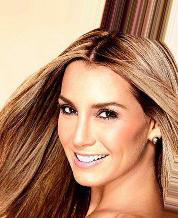
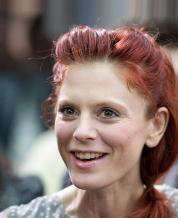
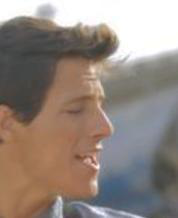
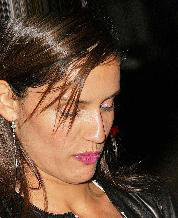
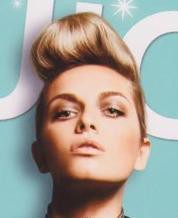
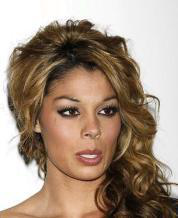
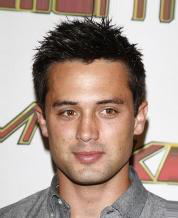
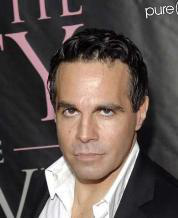
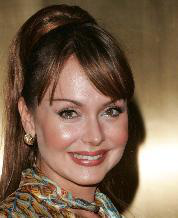
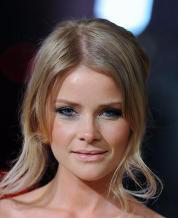

In [75]:
sf_images[:10].explore()

In [76]:
!pip install face_recognition

     |████████████████████████████████| 100.2MB 128kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566172 sha256=f0e98a5883dae6ffb5f8ff845a1bd8bbdc85056a7564b8e6861fe1ecfc175efd
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


Create a face recognition model using the celeb images

In [77]:
import cv2
import face_recognition  # requires CPUs\GPUs in Colab

known_faces = []
names_images = {}
for row in sf_images:
  names_images[row['image_name']] = row['path']

for name, pic in names_images.items():
  pic_path = os.path.join(DATASET_PATH_CELEB_PATH, f'img_align_celeba/{name}')
  loaded_pic = face_recognition.load_image_file(pic_path)
  try:
    encoding_pic = face_recognition.face_encodings(loaded_pic)[0]
    known_faces.append(encoding_pic)
  except:
    pass
known_faces

[array([-0.10657217,  0.12290109,  0.06805273, -0.0410724 , -0.09091279,
         0.05011663, -0.0721484 , -0.11483933,  0.21993797, -0.10229716,
         0.27614284, -0.0833949 , -0.36798561,  0.08410606, -0.08547525,
         0.19960544, -0.26343495, -0.13145219, -0.12658644, -0.08161981,
        -0.03662761, -0.03098517,  0.05915865,  0.11871026, -0.21404639,
        -0.38162726, -0.01394536, -0.06993267, -0.03561921, -0.2225693 ,
         0.02732603,  0.07517886, -0.15110426,  0.10615967, -0.00903842,
         0.12946717, -0.01675484, -0.17476825,  0.20844416, -0.03255182,
        -0.22278212, -0.10950564,  0.08133391,  0.29120237,  0.26651284,
        -0.11200809,  0.01510112, -0.07966056,  0.15839767, -0.33412936,
         0.0168736 ,  0.17194505,  0.05552773,  0.10473287,  0.15672112,
        -0.12233052, -0.00978367,  0.17710155, -0.09993095, -0.02218649,
         0.10385872, -0.00371399,  0.05319752, -0.11833106,  0.27340221,
         0.12507743, -0.21254879, -0.11757356,  0.1

Let try a new picture of a celeb

In [78]:
from google.colab import files
pic_path = 'https://www.kidderminstershuttle.co.uk/resources/images/870455.jpg?display=1&htype=100001&type=responsive-gallery'
pic_name = 'exam_mask_detection.jpg'
import os
import urllib.request
urllib.request.urlretrieve(pic_path, pic_name)

('exam_mask_detection.jpg', <http.client.HTTPMessage at 0x7fe74d299710>)

Detect face and classify, also plot the original picture

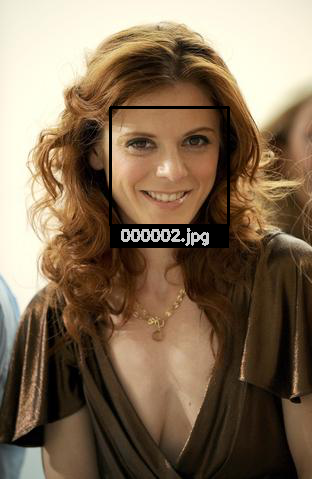

The detected picture 000002.jpg:


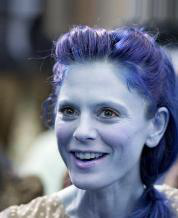

In [79]:
import os
import cv2
from google.colab.patches import cv2_imshow
from skimage import io

# Returns (R, G, B) from name
def name_to_color(name):
    # Take 3 first letters, tolower()
    # lowercased character ord() value rage is 97 to 122, substract 97, multiply by 8
    color = [(ord(c.lower())-97)*8 for c in name[:3]]
    return color

TOLERANCE = 0.7
FRAME_THICKNESS = 2
FONT_THICKNESS = 2
known_names = list(names_images.keys())


pic_full_path = '/content/exam_mask_detection.jpg'
# pic_full_path = os.path.join(DATASET_PATH_CELEB_PATH,f'img_align_celeba/000002.jpg')
image = face_recognition.load_image_file(pic_full_path)

# This time we first grab face locations - we'll need them to draw boxes
locations = face_recognition.face_locations(image, model='cnn')

# Now since we know loctions, we can pass them to face_encodings as second argument
# Without that it will search for faces once again slowing down whole process
encodings = face_recognition.face_encodings(image, locations)

# We passed our image through face_locations and face_encodings, so we can modify it
# First we need to convert it from RGB to BGR as we are going to work with cv2
image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# But this time we assume that there might be more faces in an image - we can find faces of dirrerent people
for face_encoding, face_location in zip(encodings, locations):

    # We use compare_faces (but might use face_distance as well)
    # Returns array of True/False values in order of passed known_faces
    results = face_recognition.compare_faces(known_faces, face_encoding, TOLERANCE)

    # Since order is being preserved, we check if any face was found then grab index
    # then label (name) of first matching known face withing a tolerance
    match = None
    if True in results:  # If at least one is true, get a name of first of found labels
        match = known_names[results.index(True)]
        # print(f' - {match} from {results}')

        # Each location contains positions in order: top, right, bottom, left
        top_left = (face_location[3], face_location[0])
        bottom_right = (face_location[1], face_location[2])

        # Get color by name using our fancy function
        color = name_to_color(match)

        # Paint frame
        cv2.rectangle(image, top_left, bottom_right, color, FRAME_THICKNESS)

        # Now we need smaller, filled grame below for a name
        # This time we use bottom in both corners - to start from bottom and move 50 pixels down
        top_left = (face_location[3], face_location[2])
        bottom_right = (face_location[1], face_location[2] + 22)

        # Paint frame
        cv2.rectangle(image, top_left, bottom_right, color, cv2.FILLED)

        # Wite a name
        cv2.putText(image, match, (face_location[3] + 10, face_location[2] + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (200, 200, 200), FONT_THICKNESS)

# Show image
cv2_imshow(image)

original_img_name = os.path.join(DATASET_PATH_CELEB_PATH,f'img_align_celeba/{match}')
print(f'The detected picture {match}:')
image = face_recognition.load_image_file(original_img_name)
cv2_imshow(image)

In [80]:
# ImageAi doesn't support tensorflow 2.0 (yet)
!pip uninstall --yes tensorflow
!pip uninstall --yes keras
!pip install tensorflow==1.4.0
!pip install keras==2.2
!pip install  imageai

Uninstalling tensorflow-2.0.1:
  Successfully uninstalled tensorflow-2.0.1
Uninstalling Keras-2.3.1:
  Successfully uninstalled Keras-2.3.1
     |████████████████████████████████| 41.2MB 66kB/s 
     |████████████████████████████████| 1.7MB 48.5MB/s 
     |████████████████████████████████| 890kB 48.6MB/s 
  Created wheel for html5lib: filename=html5lib-0.9999999-cp36-none-any.whl size=107220 sha256=a892bd81dfc9dd7ecc2b5e4e336ecd0771152581cf880c907543625f79118062
  Stored in directory: /root/.cache/pip/wheels/50/ae/f9/d2b189788efcf61d1ee0e36045476735c838898eef1cad6e29
Successfully built html5lib
ERROR: fancyimpute 0.4.3 requires keras>=2.0.0, which is not installed.
ERROR: turicreate 6.3 has requirement tensorflow<=2.0.1,>=2.0.0, but you'll have tensorflow 1.4.0 which is incompatible.
  Found existing installation: html5lib 1.0.1
    Uninstalling html5lib-1.0.1:
      Successfully uninstalled html5lib-1.0.1
  Found existing installation: bleach 3.1.5
    Uninstalling bleach-3.1.5:
     

     |████████████████████████████████| 307kB 10.8MB/s 
     |████████████████████████████████| 51kB 8.0MB/s 
  Found existing installation: Keras-Preprocessing 1.1.2
    Uninstalling Keras-Preprocessing-1.1.2:
      Successfully uninstalled Keras-Preprocessing-1.1.2
  Found existing installation: Keras-Applications 1.0.8
    Uninstalling Keras-Applications-1.0.8:
      Successfully uninstalled Keras-Applications-1.0.8
     |████████████████████████████████| 184kB 8.8MB/s 


Let's use object detection

In [81]:
from imageai.Detection import ObjectDetection
from IPython.display import Image
import imageai
from imageai.Prediction import ImagePrediction

from imageai.Detection import ObjectDetection

download_image = 'https://github.com/javirk/Person_remover/blob/master/images_readme/Imagen4.png?raw=true'
save_image = 'store.jpg'
output_image = 'output.jpg'
!wget -O ./store.jpg $download_image!d

!wget -O ./resnet50_coco_best_v2.0.1.h5 https://github.com/OlafenwaMoses/ImageAI/releases/download/1.0/resnet50_coco_best_v2.0.1.h5
model_path = "./resnet50_coco_best_v2.0.1.h5"

detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath(model_path)
detector.loadModel()

detections = detector.detectObjectsFromImage(input_image=save_image, 
                                             output_image_path=output_image,
                                             minimum_percentage_probability=20
                                            )

for eachObject in detections:
    print(eachObject["name"] , " : " , eachObject["percentage_probability"] )


Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:469: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:470: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:471: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:472: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1

--2020-07-01 14:27:50--  https://github.com/javirk/Person_remover/blob/master/images_readme/Imagen4.png?raw=true!d
Resolving github.com (github.com)... 13.229.188.59
Connecting to github.com (github.com)|13.229.188.59|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/javirk/Person_remover/raw/master/images_readme/Imagen4.png [following]
--2020-07-01 14:27:50--  https://github.com/javirk/Person_remover/raw/master/images_readme/Imagen4.png
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/javirk/Person_remover/master/images_readme/Imagen4.png [following]
--2020-07-01 14:27:51--  https://raw.githubusercontent.com/javirk/Person_remover/master/images_readme/Imagen4.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|1

Streaming output truncated to the last 5000 lines.

The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:509: DeprecationWarning:

The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:509: DeprecationWarning:

The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:509: DeprecationWarning:

The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/tensor_util.py:509: DeprecationWarning:

The binary mode of fromstring is deprecated, as it behav

stop sign  :  25.111639499664307
car  :  56.654757261276245
car  :  52.784037590026855
person  :  37.548989057540894
person  :  77.81097888946533
car  :  25.568944215774536
person  :  53.080326318740845
car  :  20.332355797290802
truck  :  23.494216799736023
truck  :  26.501435041427612
truck  :  23.70285987854004
car  :  65.45469760894775
car  :  73.04458618164062
truck  :  42.86803901195526


Plot the new picture

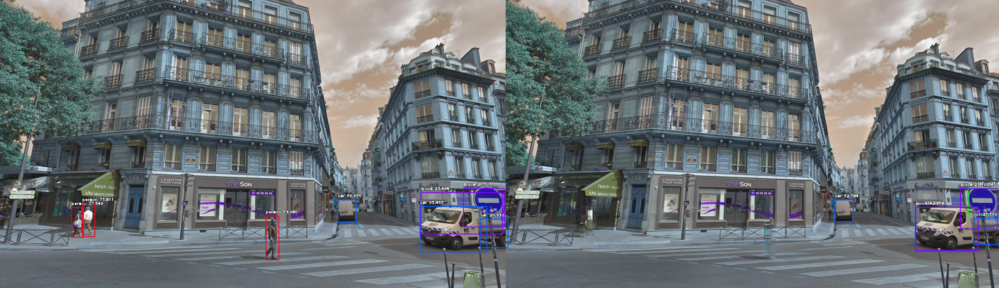

In [82]:
image = face_recognition.load_image_file(output_image)
cv2_imshow(image)